# Configure SBS Parameters

This notebook should be used as a test for ensuring correct SBS image loading and processing before running the SBS module.
Cells marked with <font color='red'>SET PARAMETERS</font> contain crucial variables that need to be set according to your specific experimental setup and data organization.
Please review and modify these variables as needed before proceeding with the analysis.

## <font color='red'>SET PARAMETERS</font>

### Fixed parameters for SBS processing

- `CONFIG_FILE_PATH`: Path to a Brieflow config file used during processing. Absolute or relative to where workflows are run from.

In [1]:
CONFIG_FILE_PATH = "config/config.yml"

## Imports

In [2]:
from pathlib import Path

import yaml
from tifffile import imread
import pandas as pd
from snakemake.io import expand
from microfilm.microplot import Microimage
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

from lib.shared.configuration_utils import (
    CONFIG_FILE_HEADER,
    create_micropanel,
    random_cmap,
    image_segmentation_annotations,
)
from lib.shared.file_utils import get_filename
from lib.sbs.align_cycles import align_cycles
from lib.shared.log_filter import log_filter
from lib.sbs.compute_standard_deviation import compute_standard_deviation
from lib.sbs.max_filter import max_filter
from lib.sbs.find_peaks import find_peaks, find_peaks_spotiflow, plot_channels_with_peaks
from lib.shared.illumination_correction import apply_ic_field, combine_ic_images
from lib.shared.segment_cellpose import prepare_cellpose
from lib.cluster.scrape_benchmarks import get_uniprot_data
from lib.sbs.standardize_barcode_design import standardize_barcode_design, get_barcode_list
from lib.sbs.extract_bases import extract_bases
from lib.sbs.call_reads import call_reads, plot_normalization_comparison
from lib.sbs.call_cells import call_cells
from lib.shared.extract_phenotype_minimal import extract_phenotype_minimal
from lib.sbs.eval_mapping import (
    plot_mapping_vs_threshold,
    plot_cell_mapping_heatmap,
    plot_cell_metric_histogram,
    plot_gene_symbol_histogram,
)

/home/edeny/miniconda3/envs/brieflow_ramon/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## <font color='red'>SET PARAMETERS</font>

### Parameters for testing SBS processing

- `TEST_PLATE`, `TEST_WELL`, `TEST_TILE`: Plate/well/tile combination used for configuring parameters in this notebook.

### Channels

- `CHANNEL_NAMES`: A list of ordered names for each channel in your SBS image. 
- `CHANNEL_CMAPS`: A list of color maps to use when showing channel microimages. These need to be a Matplotlib or microfilm colormap. We recommend using: `["pure_red", "pure_green", "pure_blue", "pure_cyan", "pure_magenta", "pure_yellow"]`.

In [3]:
# Define test well and tile
TEST_PLATE = 1
TEST_WELL = "A1"
TEST_TILE = 1301
# Derive wildcard dictionary for testing
WILDCARDS = dict(well=TEST_WELL, tile=TEST_TILE)

# Define image channels with DAPI as the first channel
CHANNEL_NAMES = ["DAPI", "TUB", "G", "T", "A", "C"]
CHANNEL_CMAPS = ["pure_blue", "pure_cyan", "pure_green", "pure_red", "pure_yellow", "pure_magenta"]

# Remove DAPI channel to get bases
BASES = [channel for channel in CHANNEL_NAMES if channel in ["G", "T", "A", "C"]]
EXTRA_CHANNELS = [channel for channel in CHANNEL_NAMES if channel not in ["G", "T", "A", "C"]]

## <font color='red'>SET PARAMETERS</font>

  ### Alignment
  - `ALIGNMENT_METHOD`: Optional. Method for aligning SBS images between cycles. If not specified, the method will be automatically selected based on available channels, but can be overridden by the user:
      - `DAPI`: the DAPI channel is used for alignment between cycles. Automatically selected if **DAPI is present in each** round of SBS imaging.
      - `sbs_mean`: the mean intensity of base channels is used for alignment between cycles. Automatically selected if **DAPI is not present in each** round of SBS imaging.
  - `UPSAMPLE_FACTOR`: Factor used for subpixel alignment. Defaults to `2`
      - Higher values provide more precise alignment but increase processing time.
      - Set to `1` to disable subpixel alignment for faster processing.
  - `SKIP_CYCLES`: Optional. List of cycle indices to skip during alignment. Defaults to `None`
      - Use this to exclude problematic cycles that would interfere with alignment
      - Example: `[1]` to skip the first cycle, `[1, 6]` to skip cycles 1 and 6
      - Skipped cycles are completely removed from processing and will not appear in final results
  - `MANUAL_BACKGROUND_CYCLE`: Optional. Specific cycle to use as the source for segmentation background channels. Defaults to `None`
      - Use this when you have segmentation channels (e.g., DAPI, Vimentin) in a specific cycle that you want propagated to all cycles
      - If not specified, automatically selects the cycle with the most extra (non-GTAC) channels
      - Example: `3` to use cycle 3 as the source for background channels
      - Note: This refers to the original cycle number before any cycles are skipped
      - **Only works with simple channel configurations** (see note below)
  - `MANUAL_CHANNEL_MAPPING`: Optional. Explicit specification of which channels are present in each cycle. Defaults to `None`
      - Required when channel structure varies across cycles in non-standard ways
      - Provide a list of channel name lists, one per cycle, matching the order channels appear in each cycle's image data
      - The function will map channels by name to create the final output matching `CHANNEL_NAMES`

  **Note on Channel Configuration:**

  SBS images are commonly generated in two ways:
  1. **Same channels across all cycles** - All cycles have identical channel structure (e.g., all have DAPI, Vimentin, G, T, A, C)
  2. **Base channels + one background cycle** - Most cycles have only base channels (G, T, A, C), and one cycle has additional channels for segmentation (e.g., DAPI, Vimentin) at the beginning or end of the channel array

  If your imaging setup deviates from these approaches (e.g., some cycles missing channels that are in the middle of your target channel order), you must use `MANUAL_CHANNEL_MAPPING` to explicitly specify which channels are
  present in each cycle.

  **Example:** If `CHANNEL_NAMES = ["DAPI", "Vimentin", "G", "T", "A", "C"]` but only cycle 3 has Vimentin:

  ```python
  MANUAL_CHANNEL_MAPPING = [
      ["DAPI", "G", "T", "A", "C"],              # Cycle 1: no Vimentin
      ["DAPI", "G", "T", "A", "C"],              # Cycle 2: no Vimentin
      ["DAPI", "Vimentin", "G", "T", "A", "C"],  # Cycle 3: has Vimentin
      ["DAPI", "G", "T", "A", "C"],              # Cycle 4: no Vimentin
      # ... repeat for all cycles
  ]
  MANUAL_BACKGROUND_CYCLE = 3  # Source for Vimentin propagation
  ```

  The function will copy Vimentin from cycle 3 to all other cycles, creating output with shape (n_cycles, 6, height, width) where all cycles have the full `CHANNEL_NAMES` channel order.

In [4]:
ALIGNMENT_METHOD = "DAPI"
UPSAMPLE_FACTOR = 5
SKIP_CYCLES = None
MANUAL_BACKGROUND_CYCLE = 15
MANUAL_CHANNEL_MAPPING = [
        ["DAPI", "G", "T", "A", "C"],           
        ["DAPI", "G", "T", "A", "C"], 
        ["DAPI", "Vimentin", "G", "T", "A", "C"], # Vimentin added in cycle 3
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["DAPI", "G", "T", "A", "C"],
        ["TUB", "DAPI"],
    ]

Loading test images...
Aligning test images...
Cycle 0: ['DAPI', 'G', 'T', 'A', 'C'] -> ['DAPI', 'TUB', 'G', 'T', 'A', 'C']
  DAPI: copied from current cycle position 0
  TUB: copied from cycle 14 position 0
  G: copied from current cycle position 1
  T: copied from current cycle position 2
  A: copied from current cycle position 3
  C: copied from current cycle position 4
Cycle 1: ['DAPI', 'G', 'T', 'A', 'C'] -> ['DAPI', 'TUB', 'G', 'T', 'A', 'C']
  DAPI: copied from current cycle position 0
  TUB: copied from cycle 14 position 0
  G: copied from current cycle position 1
  T: copied from current cycle position 2
  A: copied from current cycle position 3
  C: copied from current cycle position 4
Cycle 2: ['DAPI', 'Vimentin', 'G', 'T', 'A', 'C'] -> ['DAPI', 'TUB', 'G', 'T', 'A', 'C']
  DAPI: copied from current cycle position 0
  TUB: copied from cycle 14 position 0
  G: copied from current cycle position 2
  T: copied from current cycle position 3
  A: copied from current cycle positio

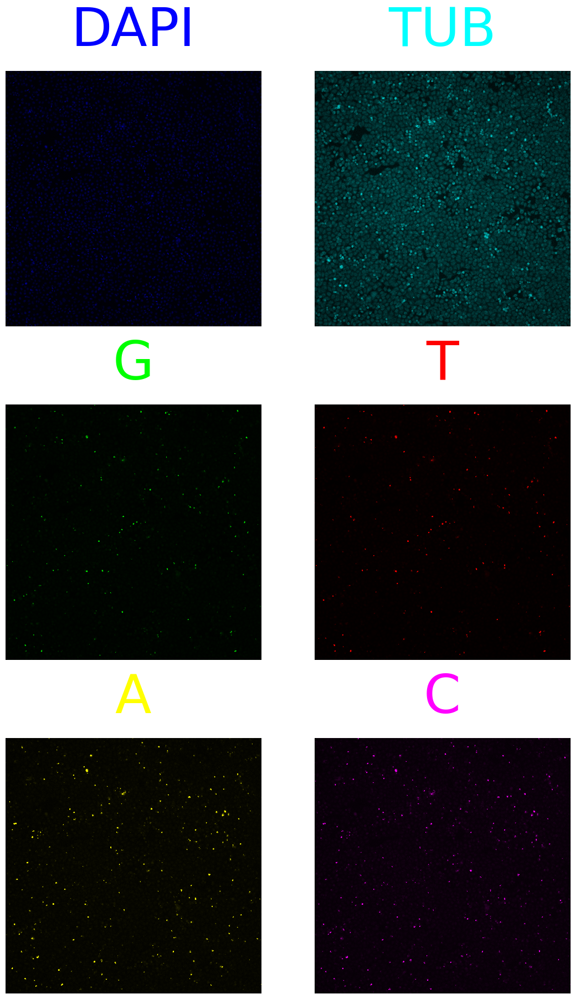

In [5]:
# load config file
with open(CONFIG_FILE_PATH, "r") as config_file:
    config = yaml.safe_load(config_file)

# Get paths to the sample files dfs
SBS_SAMPLES_FP = Path(config["preprocess"]["sbs_samples_fp"])
# Load the sample TSV files with pandas
sbs_samples = pd.read_csv(SBS_SAMPLES_FP, sep="\t")
SBS_CYCLES = sorted(list(sbs_samples["cycle"].unique()))
# Define cycles for testing if not None
SKIP_CYCLES_INDICES = [SBS_CYCLES.index(c) for c in SKIP_CYCLES] if SKIP_CYCLES is not None else None
MANUAL_BACKGROUND_CYCLE_INDEX = SBS_CYCLES.index(MANUAL_BACKGROUND_CYCLE) if MANUAL_BACKGROUND_CYCLE is not None else None

# load test image data
print("Loading test images...")
ROOT_FP = Path(config["all"]["root_fp"])
PREPROCESS_FP = ROOT_FP / "preprocess"
sbs_test_image_paths = expand(
    PREPROCESS_FP
    / "images"
    / "sbs"
    / get_filename(
        {"plate": TEST_PLATE, "well": TEST_WELL, "tile": TEST_TILE, "cycle": "{cycle}"},
        "image",
        "tiff",
    ),
    cycle=SBS_CYCLES,
)
sbs_test_images = [imread(file_path) for file_path in sbs_test_image_paths]

# align cycles
print("Aligning test images...")
aligned = align_cycles(
    sbs_test_images,
    channel_order=CHANNEL_NAMES,
    method=ALIGNMENT_METHOD,
    upsample_factor=UPSAMPLE_FACTOR,
    skip_cycles=SKIP_CYCLES_INDICES,
    manual_background_cycle=MANUAL_BACKGROUND_CYCLE_INDEX,
    manual_channel_mapping=MANUAL_CHANNEL_MAPPING,
    verbose=True,
)

# Create and display micropanel of aligned images
print("Example aligned image for first cycle:")
aligned_microimages = [
    Microimage(
        aligned[0, i, :, :], channel_names=CHANNEL_NAMES[i], cmaps=CHANNEL_CMAPS[i]
    )
    for i in range(aligned.shape[1])
]
aligned_panel = create_micropanel(aligned_microimages, add_channel_label=True)
plt.show()

# NOTE: You can also loop through all your cycles to display micropanels to be sure of alignment by uncommenting the following lines:
# for cycle_idx in range(aligned.shape[0]):  # Adjust this range if you have a different number of cycles
#     print(f"Example aligned image for cycle {cycle_idx + 1}:")
#     aligned_microimages = [
#         Microimage(
#             aligned[cycle_idx, i, :, :], channel_names=CHANNEL_NAMES[i], cmaps=CHANNEL_CMAPS[i]
#         )
#         for i in range(aligned.shape[1])
#     ]
#     aligned_panel = create_micropanel(aligned_microimages, add_channel_label=True)
#     plt.show()

## <font color='red'>SET PARAMETERS</font>

### Spot detection

- `MAX_FILTER_WIDTH`: Width parameter used for determining the neighborhood size for finding local maxima. No default value, but `3` is suggested
- `SPOT_DETECTION_METHOD`: Methodology for calling spots: 
    - `STANDARD`: Standard method for calling spots, involving Laplacian of Gaussian correction, and computation of spots across cycles. Spots are identified based on signal intensity and consistency across cycles.
        - `PEAK_WIDTH`: Width parameter used for peak detection, sets neighborhood size for finding local maxima of base channels standard deviation. Defaults to `5`
    - `SPOTIFLOW`: Deep learning based methodology for calling spots. Spots are called independently on all 4 bases of a selected cycle, and then coalesced to ensure minimum distance between spots. If this method is selected, the following parameters are required:
        - `SPOTIFLOW_CYCLE_INDEX`: Cycle to use for spot detection
        - `SPOTIFLOW_MODEL`: Model to use for spot detection (e.g., "general", "hybiss")
        - `SPOTIFLOW_THRESHOLD`: Probability threshold for confidence in spot detection
        - `SPOTIFLOW_MIN_DISTANCE`: Minimum distance (in pixels) required between detected spots


In [6]:
# Extract the PROPERLY aligned TUB from cycle 15
tub_aligned = aligned[14, 1, :, :]  # Cycle 15, TUB is at index 1

# Replace the misaligned TUB in cycles 0-13 with the properly aligned one
for cycle_idx in range(14):
    aligned[cycle_idx, 1, :, :] = tub_aligned
# Use first 14 cycles for spot detection and downstream analysis
aligned_1_14 = aligned[:14] 
print(f"Aligned array shape: {aligned.shape}")
print(f"Array for spot detection shape: {aligned_1_14.shape}") 


Aligned array shape: (15, 6, 2400, 2400)
Array for spot detection shape: (14, 6, 2400, 2400)



=== CHECKING DAPI AND TUB ALIGNMENT ===


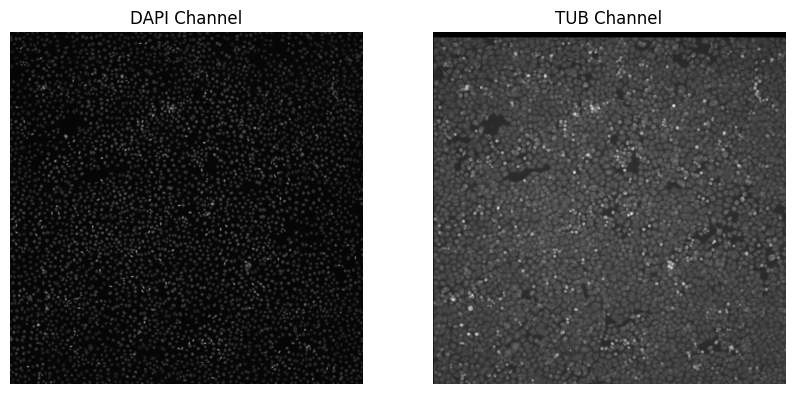

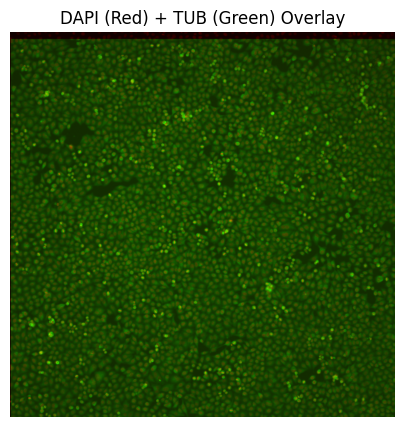

In [7]:
# DIAGNOSTIC CHECK
print("\n=== CHECKING DAPI AND TUB ALIGNMENT ===")
test_cycle = aligned_1_14[0]  # Cycle 1
dapi_channel = test_cycle[0]  # DAPI
tub_channel = test_cycle[1]   # TUB

# Display DAPI and TUB channels side by side for visual inspection
fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(dapi_channel, cmap='gray')
axes[0].set_title('DAPI Channel')
axes[0].axis('off')
axes[1].imshow(tub_channel, cmap='gray')
axes[1].set_title('TUB Channel')
axes[1].axis('off')
plt.show()
#Add overlay to check alignment
overlay = np.zeros((*dapi_channel.shape, 3), dtype=np.float32)
overlay[..., 0] = dapi_channel / np.max(dapi_channel)  # Red
overlay[..., 1] = tub_channel / np.max(tub_channel)    # Green

# Display overlay
plt.figure(figsize=(5, 5))
plt.imshow(overlay)
plt.title('DAPI (Red) + TUB (Green) Overlay')
plt.axis('off')
plt.show()

In [8]:
# Set parameters:
MAX_FILTER_WIDTH = 3
SPOT_DETECTION_METHOD = "standard"

if SPOT_DETECTION_METHOD == "standard":
   PEAK_WIDTH = 5

elif SPOT_DETECTION_METHOD == "spotiflow":
   SPOTIFLOW_CYCLE_INDEX = 0
   SPOTIFLOW_MODEL = "general"
   SPOTIFLOW_THRESHOLD = 0.3         
   SPOTIFLOW_MIN_DISTANCE = 1

# Derive extra channel indices
EXTRA_CHANNEL_INDICES = [CHANNEL_NAMES.index(channel) for channel in EXTRA_CHANNELS]

Detecting candidate reads...
Applying Laplacian-of-Gaussian (LoG) filter...
Applying max filter...
Computing standard deviation over cycles...
Finding peaks using standard method...
Example max filtered image for first cycle:


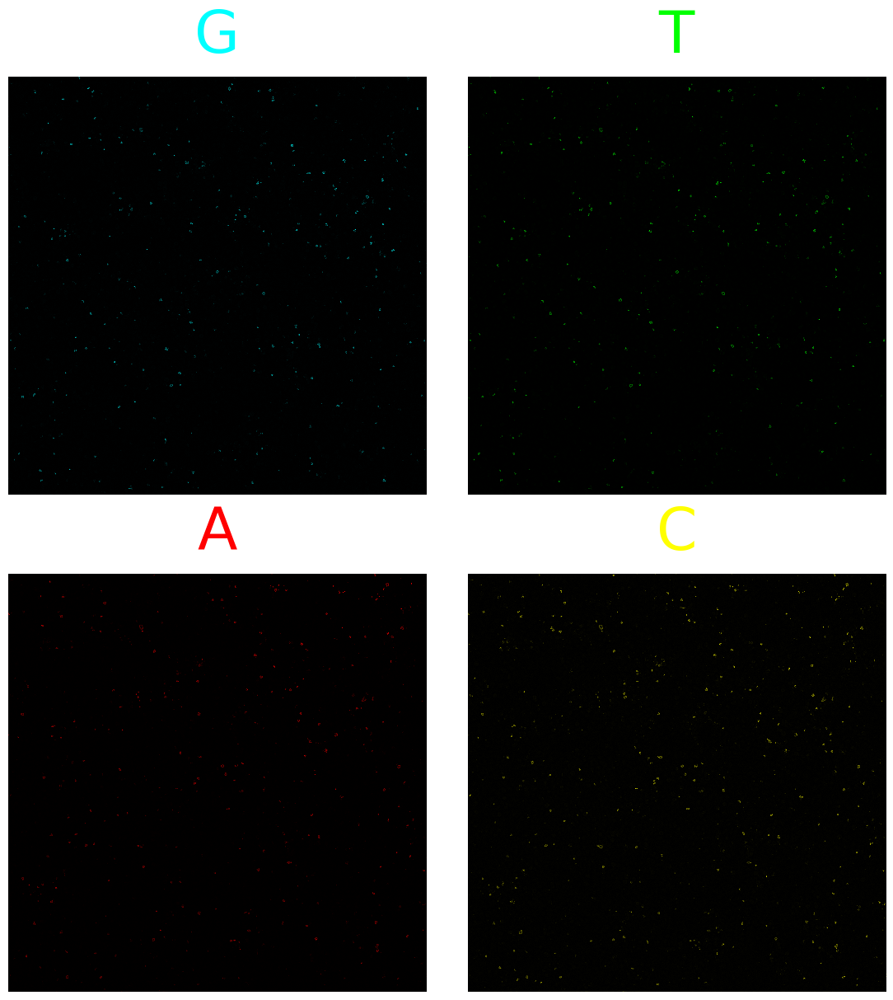

Found 2407 peaks above threshold 60


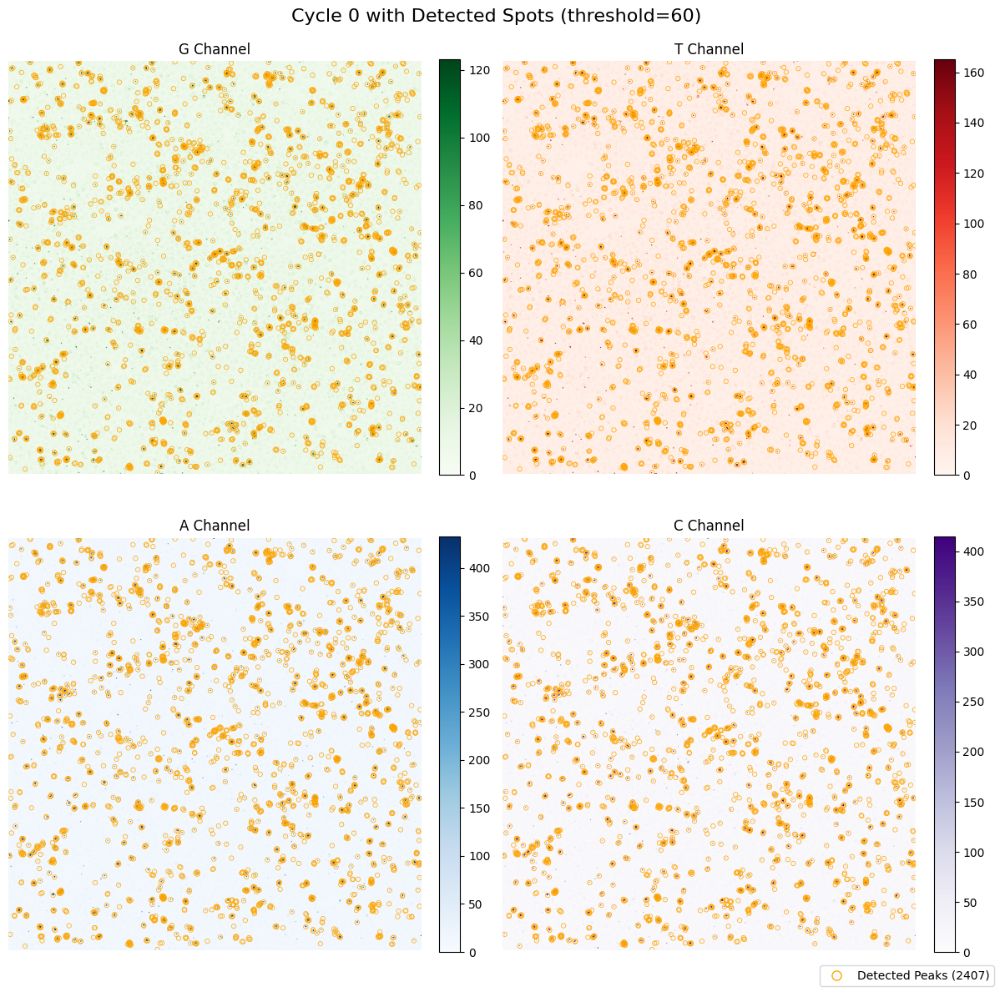

In [9]:
print("Detecting candidate reads...")

print("Applying Laplacian-of-Gaussian (LoG) filter...")
loged = log_filter(aligned_1_14, skip_index=EXTRA_CHANNEL_INDICES)

print("Applying max filter...")
maxed = max_filter(loged, width=MAX_FILTER_WIDTH, remove_index=EXTRA_CHANNEL_INDICES)

if SPOT_DETECTION_METHOD == "standard":
    print("Computing standard deviation over cycles...")
    standard_deviation = compute_standard_deviation(loged, remove_index=EXTRA_CHANNEL_INDICES)
    
    print("Finding peaks using standard method...")
    peaks = find_peaks(standard_deviation, width=PEAK_WIDTH)
    
elif SPOT_DETECTION_METHOD == "spotiflow":
    print(f"Finding peaks using Spotiflow (model: {SPOTIFLOW_MODEL})...")
    peaks, _ = find_peaks_spotiflow(
        aligned_images=aligned_1_14, 
        cycle_idx=SPOTIFLOW_CYCLE_INDEX,
        model=SPOTIFLOW_MODEL,
        prob_thresh=SPOTIFLOW_THRESHOLD,
        min_distance=SPOTIFLOW_MIN_DISTANCE,
        verbose=True
    )

# Create and display micropanel of max filtered datas
print("Example max filtered image for first cycle:")
maxed_microimages = [
    Microimage(maxed[1, i, :, :], channel_names=BASES[i], cmaps=CHANNEL_CMAPS[i + 1])
    for i in range(maxed.shape[1])
]
maxed_panel = create_micropanel(maxed_microimages, add_channel_label=True)
plt.show()

# Plot spots on base channels
fig, axes = plot_channels_with_peaks(
    maxed,                 
    peaks,
    BASES,        
    cycle_number=0,   
    threshold_peaks=60 if SPOT_DETECTION_METHOD == "standard" else None,
    peak_colors=['orange'],
    peak_labels=['Detected Peaks']
)
plt.show()

In [15]:
# Saving outlines of peaks as TIFF files for manual inspection
import numpy as np
from tifffile import imwrite
from skimage.draw import circle_perimeter  # draws ring outlines

print("\n=== SAVING CIRCLE OUTLINES ===")
cutoffs = [50, 75, 100]
CIRCLE_RADIUS = 5  # adjust for bigger/smaller rings

for cutoff in cutoffs:
    # Find coordinates of all peaks above the cutoff
    coords = np.argwhere(peaks >= cutoff)  # shape: (N, 2) with (y, x)

    # Create a blank image, same size as peaks
    circle_mask = np.zeros_like(peaks, dtype=np.uint8)

    # Draw circle outlines at each peak location
    for y, x in coords:
        rr, cc = circle_perimeter(y, x, CIRCLE_RADIUS, shape=circle_mask.shape)
        circle_mask[rr, cc] = 255  # white ring

    # Save as TIFF
    filename = f"peaks_circles_outline_cutoff_{cutoff}.tiff"
    imwrite(filename, circle_mask)

    print(f"Saved: {filename}")
    print(f"  - Peaks drawn: {len(coords)}")
print("\n=== COMPLETE ===")


=== SAVING CIRCLE OUTLINES ===
Saved: peaks_circles_outline_cutoff_50.tiff
  - Peaks drawn: 2566
Saved: peaks_circles_outline_cutoff_75.tiff
  - Peaks drawn: 2193
Saved: peaks_circles_outline_cutoff_100.tiff
  - Peaks drawn: 1887

=== COMPLETE ===


In [ ]:
# Saving aligned images as TIFF file for diagnostics
from tifffile import imwrite
imwrite("aligned.tiff", aligned)
imwrite("aligned_1_14.tiff", aligned_1_14)

## <font color='red'>SET PARAMETERS</font>

### Illumination Correction and Segmentation

- `DAPI_CYCLE`: Cycle number where DAPI was imaged. Used for illumination correction of the DAPI channel.
- `CYTO_CYCLE`: Cycle number where the cytoplasmic/background channel was imaged. Used for illumination correction of the cytoplasmic channel.
- `CYTO_CHANNEL`: The name of the cytoplasmic channel used for cell boundary detection. 
  - When `DAPI_CYCLE == CYTO_CYCLE`: Can be any channel imaged in that cycle (e.g., "Vimentin", "GFP", "Phalloidin")
  - When `DAPI_CYCLE != CYTO_CYCLE`: Should be a base channel ("G", "T", "A", or "C") since DAPI was imaged separately

**Note**: Only set `DAPI_CYCLE != CYTO_CYCLE` when DAPI was imaged in a separate cycle from your cytoplasmic signal. This typically occurs when using a base channel (G, T, A, C) for cytoplasm detection because no cellular stain was available in the DAPI cycle.

In [10]:
# Define cycle to use for segmentation
DAPI_CYCLE = 1
CYTO_CYCLE = 1
# Define cytoplasmic channel
CYTO_CHANNEL = "TUB"

# Derive DAPI and CYTO indexes
DAPI_INDEX = CHANNEL_NAMES.index("DAPI")
CYTO_INDEX = CHANNEL_NAMES.index(CYTO_CHANNEL)
CYTO_CYCLE_INDEX = 0 #SBS_CYCLES.index(CYTO_CYCLE) - len([skip for skip in (SKIP_CYCLES or []) if skip < SBS_CYCLES.index(CYTO_CYCLE)])

# Validate DAPI and CYTO cycles and channels
if DAPI_CYCLE != CYTO_CYCLE and CYTO_CHANNEL not in BASES:
    raise ValueError(
       f"When DAPI_CYCLE ({DAPI_CYCLE}) != CYTO_CYCLE ({CYTO_CYCLE}), "
        f"CYTO_CHANNEL should be a base channel {BASES}, but got '{CYTO_CHANNEL}'. "
        f"If using a cellular stain, set DAPI_CYCLE = CYTO_CYCLE."
    )

Skipping IC correction for segmentation (using aligned image directly)...
Preparing IC segmentation image for CellPose...


/home/edeny/miniconda3/envs/brieflow_ramon/lib/python3.11/site-packages/skimage/util/dtype.py:576: UserWarning: Downcasting uint16 to uint8 without scaling because max value 0 fits in uint8
  return _convert(image, np.uint8, force_copy)


Pre-segmentation images:


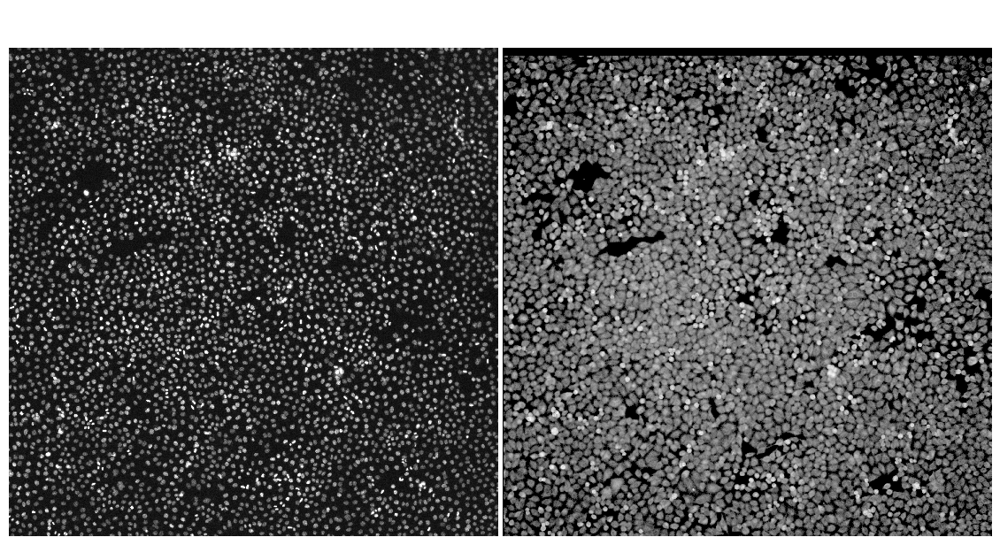

In [11]:
# Determine the cycle to use for segmentation as the cyt
aligned_image_data_segmentation_cycle = aligned_1_14[CYTO_CYCLE_INDEX]

# Select only DAPI and TUB channels (indices 0 and 1)
aligned_image_segmentation_only = aligned_image_data_segmentation_cycle[[DAPI_INDEX, CYTO_INDEX], :, :]

# print("Applying illumination correction to segmentation cycle image...")

# # Logic based on whether DAPI and CYTO come from same or different cycles
# if DAPI_CYCLE != CYTO_CYCLE:
#     # Different cycles - need to combine IC fields
#     ic_field_dapi = imread(
#         PREPROCESS_FP / "ic_fields" / "sbs" / 
#         get_filename({"plate": TEST_PLATE, "well": TEST_WELL, "cycle": DAPI_CYCLE}, "ic_field", "tiff")
#     )
#     ic_field_cyto = imread(
#         PREPROCESS_FP / "ic_fields" / "sbs" / 
#         get_filename({"plate": TEST_PLATE, "well": TEST_WELL, "cycle": CYTO_CYCLE}, "ic_field", "tiff")
#     )
#     # Combine IC fields - need to figure out the right indices for combine_ic_images
#     #ic_field = combine_ic_images([ic_field_dapi, ic_field_cyto], [EXTRA_CHANNEL_INDICES, None])

#     # Manually stack: DAPI from cycle 1 (index 0) and TUB from cycle 15 (index 0)
#     ic_field = np.stack([
#         ic_field_dapi[0],  # DAPI from cycle 1
#         ic_field_cyto[0]   # TUB from cycle 15 (TUB is first channel in that cycle)
#     ], axis=0)
# else:
#     # Same cycle - use one IC field
#     ic_field = imread(
#         PREPROCESS_FP / "ic_fields" / "sbs" / 
#         get_filename({"plate": TEST_PLATE, "well": TEST_WELL, "cycle": DAPI_CYCLE}, "ic_field", "tiff")
#     )

# # Apply illumination correction field
# corrected_image = apply_ic_field(
#     aligned_image_segmentation_only, correction=ic_field
# )

print("Skipping IC correction for segmentation (using aligned image directly)...")

# Skip IC correction - alignment already handles spatial registration
corrected_image = aligned_image_segmentation_only

# Prepare corrected image for CellPose segmentation
# NOTE: this process is done during the `segment_cellpose`` method below as well
# Use the prepared_cellpose image to test CellPose (see below)
print("Preparing IC segmentation image for CellPose...")
cellpose_rgb = prepare_cellpose(
    corrected_image,
    0,
    1,
)

# show max filtered data for one round
print("Pre-segmentation images:")
pre_seg_microimages = [
    Microimage(cellpose_rgb[2], channel_names="Dapi"),
    Microimage(cellpose_rgb[1], channel_names="Cyto"),
]
pre_seg_panel = create_micropanel(pre_seg_microimages, add_channel_label=True)
plt.show()

## <font color='red'>SET PARAMETERS</font>

### Segmentation

**IMPORTANT: GPU Recommendation for CPSAM**
If testing the CPSAM model (`cyto_model="cpsam"`), we strongly recommend:
- Using a GPU-enabled machine (`GPU=True`)
- Allocating sufficient time (segmentation can take 30+ minutes per tile)
- Consider running this notebook in a GPU-enabled environment or testing on a smaller region

#### Select Segmentation Method
- `SEGMENTATION_METHOD`: Choose from "cellpose", "microsam", "stardist", or "watershed" for cell segmentation.

#### Common Parameters
- `GPU`: Set to True to use GPU acceleration (if available).
- `RECONCILE`: Method for reconciling nuclei and cell masks (typically "contained_in_cells", which allows more than one nucleus per cell and is useful for cells that are dividing).
- `SEGMENT_CELLS`: Whether to segment cells, or only segment nuclei. If spots are contained in nuclei, there is no need to segment cell bodies. This may speed up analysis.

#### Cellpose Parameters (if using "cellpose")
- `CELLPOSE_MODEL`: CellPose model to use. Options: "cyto3" (default), "cyto2", "cyto", or "cpsam" (requires Cellpose 4.x).
- `CELL_FLOW_THRESHOLD` & `NUCLEI_FLOW_THRESHOLD`: Flow threshold for Cellpose segmentation. Default is 0.4.
- `CELL_CELLPROB_THRESHOLD` & `NUCLEI_CELLPROB_THRESHOLD`: Cell probability threshold for Cellpose. Default is 0.
- `HELPER_INDEX`: (Optional) Index of additional channel to help with CPSAM segmentation. Only used with `cyto_model="cpsam"`. Default is None.
- Note: For Cellpose 3.x models (cyto3, cyto2), nuclei and cell diameters will be estimated automatically. For CPSAM (Cellpose 4.x), diameters can be left as None and will be estimated from initial segmentation results.

#### MicroSAM Parameters (if using "microsam")
- `MICROSAM_MODEL`: MicroSAM model type. Default is "vit_b_lm".

#### StarDist Parameters (if using "stardist")
- `STARDIST_MODEL`: StarDist model type. Default is "2D_versatile_fluo".
- `CELL_PROB_THRESHOLD` & `NUCLEI_PROB_THRESHOLD`: Probability threshold for segmentation. Default is 0.479071.
- `CELL_NMS_THRESHOLD` & `NUCLEI_NMS_THRESHOLD`: Non-maximum suppression threshold. Default is 0.3.

#### Watershed Parameters (if using "watershed")
- `THRESHOLD_DAPI`: Threshold for nuclei segmentation. 
- `THRESHOLD_CELL`: Threshold for cell boundary segmentation.
- `NUCLEUS_AREA`: Range for filtering nuclei by area as a tuple (min, max).

In [12]:
# Select segmentation method
SEGMENTATION_METHOD = "cellpose"

# Common parameters
GPU = False
RECONCILE = "contained_in_cells"
SEGMENT_CELLS = True

if SEGMENTATION_METHOD == "cellpose":
    # Parameters for CellPose method
    CELLPOSE_MODEL = "cyto3"
    NUCLEI_FLOW_THRESHOLD = 0.4
    NUCLEI_CELLPROB_THRESHOLD = 0.0
    CELL_FLOW_THRESHOLD = 1 
    CELL_CELLPROB_THRESHOLD = 0
    HELPER_INDEX = None  # Optional: channel index to help with CPSAM segmentation

    # Only estimate diameters for non-CPSAM models
    if CELLPOSE_MODEL != "cpsam":
        from lib.shared.segment_cellpose import estimate_diameters
        print("Estimating optimal cell and nuclei diameters...")
        NUCLEI_DIAMETER, CELL_DIAMETER = estimate_diameters(
            corrected_image,
            dapi_index=DAPI_INDEX,
            cyto_index=CYTO_INDEX,
            cyto_model=CELLPOSE_MODEL,
        )
    else:
        print("CPSAM model selected. Initial diameters set to None.")
        print("Note: Diameters will be estimated automatically from segmentation results in the next cell.")
        NUCLEI_DIAMETER = None  # Will be estimated from segmentation
        CELL_DIAMETER = None    # Will be estimated from segmentation

elif SEGMENTATION_METHOD == "microsam":
    # Parameters for MicroSAM method
    MICROSAM_MODEL = "vit_b_lm"

elif SEGMENTATION_METHOD == "stardist":
    # Parameters for StarDist method
    STARDIST_MODEL = "2D_versatile_fluo"
    NUCLEI_PROB_THRESHOLD = 0.479071
    NUCLEI_NMS_THRESHOLD = 0.3
    CELL_PROB_THRESHOLD = 0.479071
    CELL_NMS_THRESHOLD = 0.3

elif SEGMENTATION_METHOD == "watershed":
    # Parameters for Watershed method
    THRESHOLD_DAPI = 4260 
    THRESHOLD_CELL = 1300
    NUCLEUS_AREA = (45,450)

Estimating optimal cell and nuclei diameters...
Estimating nuclei diameters...
Estimated nuclear diameter: 17.5 pixels
Estimating cell diameters...
Estimated cell diameter: 36.6 pixels


Segmenting image with cellpose...


found 4301 nuclei before removing edges
found 4260 cells before removing edges


removing edges


found 4146 nuclei before reconciling
found 4106 cells before reconciling


reconciling masks with method how=contained_in_cells

Nuclei per cell statistics:
--------------------------
Cells with 0 nuclei: 46
Cells with 1 nuclei: 4022
Cells with 2 nuclei: 38
--------------------------



found 4060 nuclei/cells after reconciling


Number of nuclei segmented: 4060
Number of cells segmented: 4060
Example microplots for DAPI channel and nuclei segmentation:


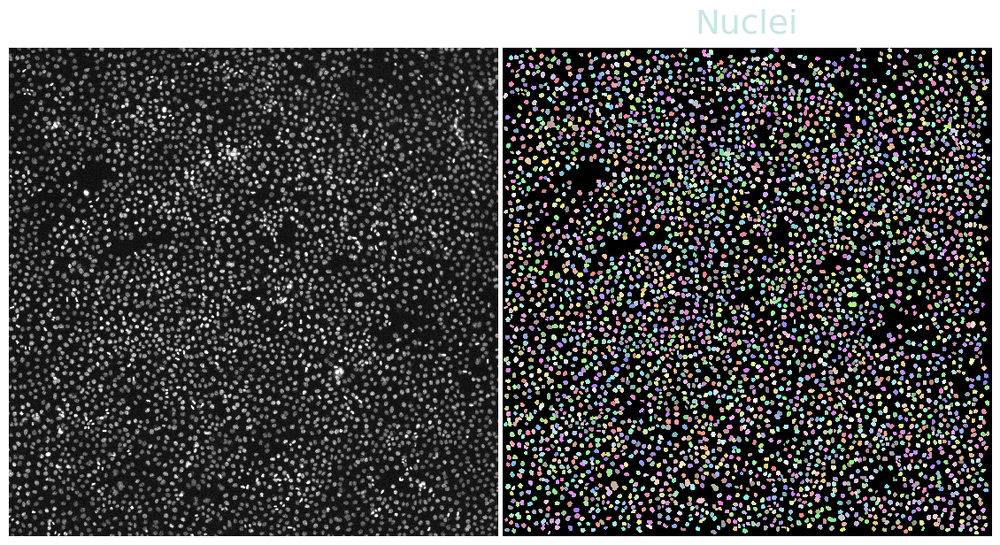

Example microplots for merged channels and cells segmentation:


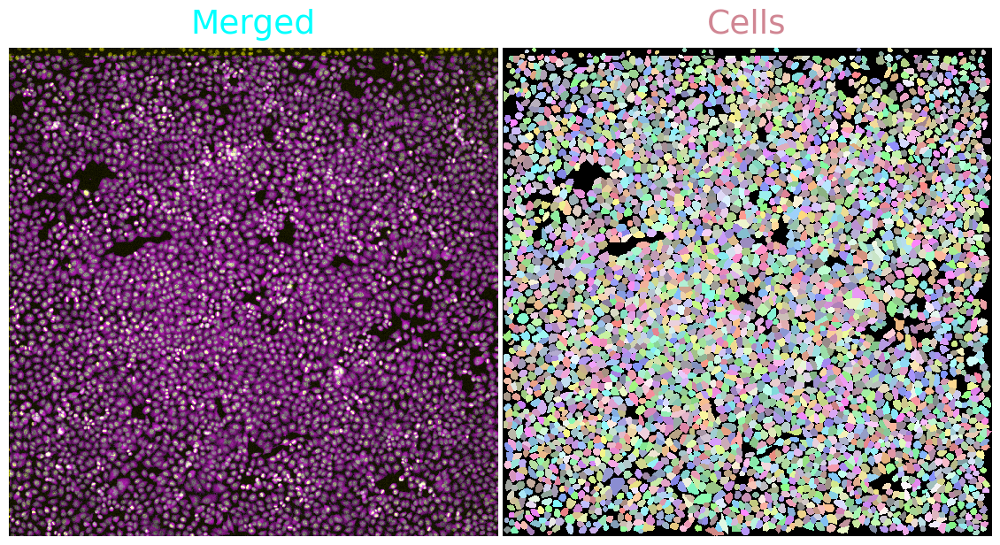

Example microplot for sequencing data annotated with segmentation:


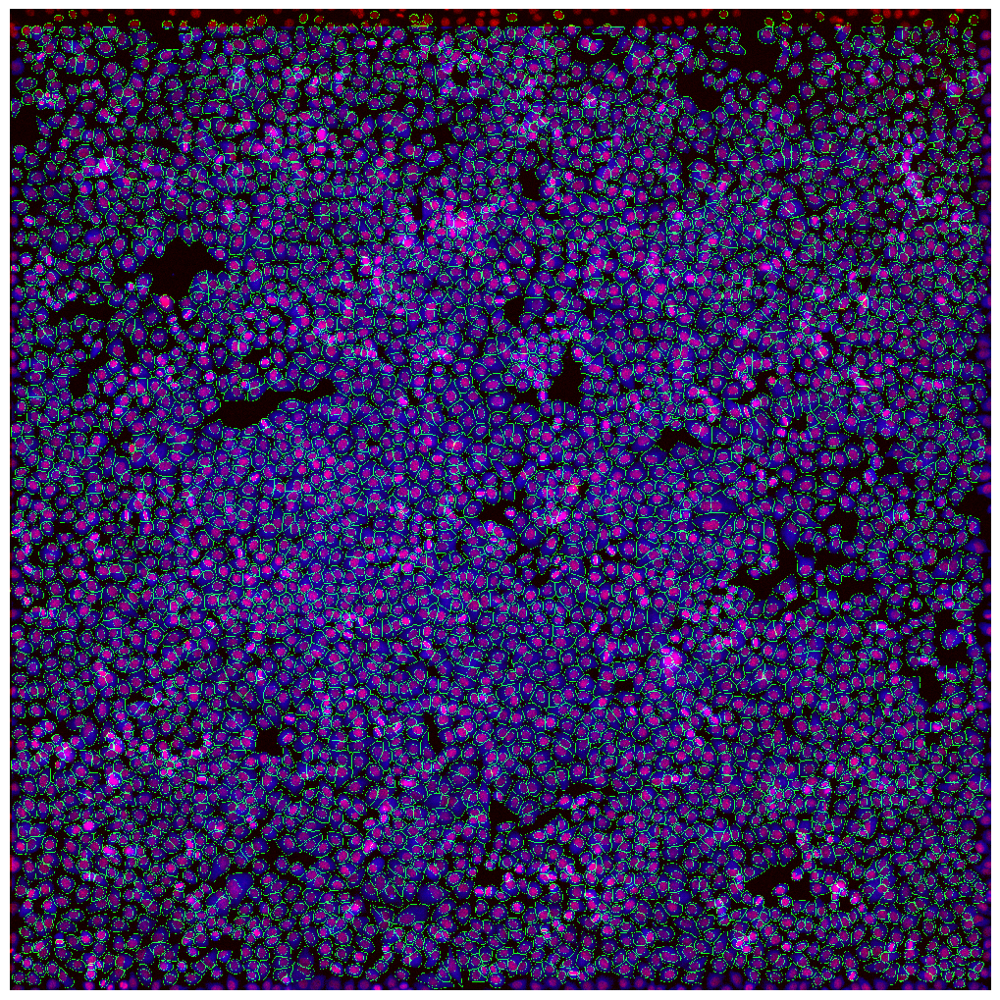

In [13]:
print(f"Segmenting image with {SEGMENTATION_METHOD}...")

if SEGMENTATION_METHOD == "cellpose":
    from lib.shared.segment_cellpose import segment_cellpose
    result = segment_cellpose(
        corrected_image,
        dapi_index=DAPI_INDEX,
        cyto_index=CYTO_INDEX,
        nuclei_diameter=NUCLEI_DIAMETER,
        cell_diameter=CELL_DIAMETER,
        cellpose_kwargs=dict(
            nuclei_flow_threshold=NUCLEI_FLOW_THRESHOLD,
            nuclei_cellprob_threshold=NUCLEI_CELLPROB_THRESHOLD,
            cell_flow_threshold=CELL_FLOW_THRESHOLD,
            cell_cellprob_threshold=CELL_CELLPROB_THRESHOLD,
        ),
        cyto_model=CELLPOSE_MODEL,
        helper_index=HELPER_INDEX,
        gpu=GPU,
        reconcile=RECONCILE,
        cells=SEGMENT_CELLS,
    )

elif SEGMENTATION_METHOD == "microsam":
    from lib.shared.segment_microsam import segment_microsam
    result = segment_microsam(
        corrected_image,
        dapi_index=DAPI_INDEX,
        cyto_index=CYTO_INDEX,
        model_type=MICROSAM_MODEL,
        gpu=GPU,
        reconcile=RECONCILE,
        cells=SEGMENT_CELLS,
    )

elif SEGMENTATION_METHOD == "stardist":
    from lib.shared.segment_stardist import segment_stardist
    result = segment_stardist(
        corrected_image,
        dapi_index=DAPI_INDEX,
        cyto_index=CYTO_INDEX,
        model_type=STARDIST_MODEL,
        stardist_kwargs=dict(
            nuclei_prob_threshold=NUCLEI_PROB_THRESHOLD,
            nuclei_nms_threshold=NUCLEI_NMS_THRESHOLD,
            cell_prob_threshold=CELL_PROB_THRESHOLD,
            cell_nms_threshold=CELL_NMS_THRESHOLD,
        ),
        gpu=GPU,
        reconcile=RECONCILE,
        cells=SEGMENT_CELLS,
    )

elif SEGMENTATION_METHOD == "watershed":
    from lib.shared.segment_watershed import segment_watershed
    result = segment_watershed(
        corrected_image,
        nuclei_threshold=THRESHOLD_DAPI,
        nuclei_area_min=NUCLEUS_AREA[0],
        nuclei_area_max=NUCLEUS_AREA[1],
        cell_threshold=THRESHOLD_CELL,
        cells=SEGMENT_CELLS,
    )

# Handle unpacking based on SEGMENT_CELLS
if SEGMENT_CELLS:
    nuclei, cells = result
else:
    nuclei = result
    cells = nuclei  # Use nuclei as cells for downstream code compatibility

# Create and display micropanel of nuclei segmention
print("Example microplots for DAPI channel and nuclei segmentation:")
nuclei_cmap = random_cmap(num_colors=len(np.unique(nuclei)))
nuclei_seg_microimages = [
    Microimage(cellpose_rgb[2], channel_names="Dapi"),
    Microimage(nuclei, cmaps=nuclei_cmap, channel_names="Nuclei"),
]
nuclei_seg_panel = create_micropanel(nuclei_seg_microimages, add_channel_label=True)
plt.show()

# Create and display micropanel of segmented cells
print(f"Example microplots for merged channels and {'cells' if SEGMENT_CELLS else 'nuclei'} segmentation:")
cells_cmap = random_cmap(num_colors=len(np.unique(cells if SEGMENT_CELLS else nuclei)))
cells_seg_microimages = [
    Microimage(cellpose_rgb, channel_names="Merged"),
    Microimage(cells if SEGMENT_CELLS else nuclei, cmaps=cells_cmap, channel_names="Cells" if SEGMENT_CELLS else "Nuclei"),
]
cells_seg_panel = create_micropanel(cells_seg_microimages, add_channel_label=True)
plt.show()

# Create and display micropanel of annotated data
print("Example microplot for sequencing data annotated with segmentation:")
annotated_data = image_segmentation_annotations(cellpose_rgb[1:], nuclei, cells if SEGMENT_CELLS else nuclei)
annotated_microimage = [
    Microimage(
        annotated_data,
        channel_names="Merged",
        cmaps=["pure_blue", "pure_red", "pure_green"],
    )
]
annotated_panel = create_micropanel(
    annotated_microimage, num_cols=1, figscaling=10, add_channel_label=False
)
plt.show()

if SEGMENTATION_METHOD == "cellpose" and CELLPOSE_MODEL == "cpsam":
    from skimage.measure import regionprops
    import numpy as np

    # Calculate nuclei diameters
    nuclei_props = regionprops(nuclei)
    nuclei_diameters = [prop.equivalent_diameter for prop in nuclei_props]
    estimated_nuclei_diameter = np.mean(nuclei_diameters)
    print(f"Nuclei - Average diameter: {estimated_nuclei_diameter:.2f} pixels")

    # Calculate cell diameters  
    cells_props = regionprops(cells)
    cells_diameters = [prop.equivalent_diameter for prop in cells_props]
    estimated_cell_diameter = np.mean(cells_diameters)
    print(f"Cells - Average diameter: {estimated_cell_diameter:.2f} pixels")
    
    # Update the diameter variables for config
    NUCLEI_DIAMETER = estimated_nuclei_diameter
    CELL_DIAMETER = estimated_cell_diameter
    print(f"\nUpdated NUCLEI_DIAMETER to {NUCLEI_DIAMETER:.2f} pixels")
    print(f"Updated CELL_DIAMETER to {CELL_DIAMETER:.2f} pixels")

Note: You may want to adjust these parameters and run segmentation tests if you feel you are capturing too little or too much area for the masks. For cellpose, the nuclei and cell diameters will be automatically estimated, but can be manually adjusted if needed. You manually can set `NUCLEI_DIAMETER` and `CELL_DIAMETER` and rerun the above blocks as many times as needed.

## <font color='red'>SET PARAMETERS</font>

### Barcode design table standardization

Raw barcode design tables from different sources often have inconsistent formatting, column names, and gene annotations that need to be cleaned and validated before analysis. This standardization step transforms your raw design file into a consistent format with validated gene symbols, standardized column names, and proper barcode prefixes for read mapping.

**Barcode Type Selection:**
- `BARCODE_TYPE`: Choose "simple" (single-barcode protocol) or "multi" (multi-barcode with MAP/RECOMB regions)
- **Default**: "simple" for standard protocols
- See Cell 32 for detailed explanation of barcode types and when to use each mode

**Essential Parameters:**
- `DF_DESIGN_FP`: File path to your raw guide RNA design file (TSV format)
- `DF_BARCODE_LIBRARY_FP`: File path where the cleaned, standardized barcode library will be saved
- `UNIPROT_DATA_FP`: File path for temporary UniProt annotation data (automatically generated and deleted)
- `GENE_SYMBOL_COL`: Column name containing gene symbols (e.g., "gene_symbol", "target_gene"). Set to `None` if unavailable
- `GENE_ID_COL`: Column name containing gene IDs (e.g., "gene_id", "ensembl_id"). Set to `None` if not needed

**Simple Mode Parameters:**
- `BARCODE_COL`: Column containing full barcode sequences (e.g., "sgRNA", "guide_sequence")
- `PREFIX_LENGTH`: Total barcode length BEFORE skipping cycles
  - Final length = PREFIX_LENGTH - number of skipped cycles
  - Example: 13 bases → skip [2,3,4] → 10 final bases
- `SKIP_CYCLES_MAP`: 1-based cycle positions to skip (e.g., `[2, 3, 4]`)
  - **IMPORTANT**: Must match `SKIP_CYCLES` from Cell 8 (imaging alignment)
  - Set to `None` if no cycles were skipped

**Multi Mode Parameters:**
- `PREFIX_MAP`: Column with MAP region barcode sequences (e.g., "iBAR2")
- `PREFIX_RECOMB`: Column with RECOMB region barcode sequences (optional)
- `MAP_PREFIX_LENGTH`: Total bases BEFORE skipping for MAP region
  - Final length = MAP_PREFIX_LENGTH - len(SKIP_CYCLES_MAP)
- `RECOMB_PREFIX_LENGTH`: Total bases BEFORE skipping for RECOMB region
  - Final length = RECOMB_PREFIX_LENGTH - len(SKIP_CYCLES_RECOMB)
- `SKIP_CYCLES_MAP`: 1-based positions to skip in MAP region (optional)
- `SKIP_CYCLES_RECOMB`: 1-based positions to skip in RECOMB region (optional)

**Non-Targeting Control Parameters:**
- `NONTARGETING_FORMAT`: Format string for standardized non-targeting names (default: "nontargeting_{prefix}")
  - Use `{prefix}` for barcode prefix, `{original}` for original name
- `NONTARGETING_PATTERNS`: List of patterns to identify non-targeting controls (default: ["nontargeting", "sg_nt", "non-targeting"])

**Note:** For complex scenarios (custom prefix generation), you can use custom prefix functions (`prefix_map_func`, `prefix_recomb_func`). See function documentation for details.

In [14]:
# Define barcode type
BARCODE_TYPE = "simple"

# Essential parameters (common to both modes)
DF_DESIGN_FP = "config/Ramon_Barcodes.csv"
DF_BARCODE_LIBRARY_FP = "config/barcode_library.tsv"
UNIPROT_DATA_FP = "config/uniprot_data.tsv"
GENE_SYMBOL_COL = "gene_symbol"
GENE_ID_COL = "gene_id"
KEEP_EXTRA_COLS = True

# Non-targeting control parameters
NONTARGETING_FORMAT = "nontargeting_{original}"  # Use {prefix} for barcode prefix, {original} for original name
NONTARGETING_PATTERNS = ["TGGT1_000000"]  # Patterns to identify controls

# Mode-specific barcode parameters
if BARCODE_TYPE == "simple":
    # Simple mode: single barcode column and prefix length
    BARCODE_COL = "sgRNA"  # Column with full barcode sequences
    
    # IMPORTANT: PREFIX_LENGTH should be the FULL barcode length in your design library
    # If you skipped cycles during imaging (Cell 8: SKIP_CYCLES), use SKIP_CYCLES_MAP below
    PREFIX_LENGTH = 14 # aligned.shape[0]  # Full barcode length (e.g., 12 for 12-base barcodes)
    
    # If you skipped cycles during imaging, set this to match SKIP_CYCLES from Cell 8
    # Example: SKIP_CYCLES = [1, 6] in Cell 8 → SKIP_CYCLES_MAP = [1, 6] here
    SKIP_CYCLES_MAP = None  # Set to list of 1-based cycle numbers to skip, or None if no cycles skipped
    
    # Multi-mode parameters set to None
    PREFIX_MAP = None
    PREFIX_RECOMB = None
    MAP_PREFIX_LENGTH = None
    RECOMB_PREFIX_LENGTH = None
    SKIP_CYCLES_RECOMB = None
    SEQUENCING_ORDER = None

elif BARCODE_TYPE == "multi":
    # Multi mode: separate columns for MAP and RECOMB regions
    PREFIX_MAP = None  # Column with MAP region barcode sequences (e.g., "iBAR2")
    PREFIX_RECOMB = None  # Column with RECOMB region barcode sequences (optional)
    MAP_PREFIX_LENGTH = None  # Length of MAP prefix to extract (e.g., 6 for cycles 0-5)
    RECOMB_PREFIX_LENGTH = None  # Length of RECOMB prefix to extract (e.g., 6 for cycles 6-11)
    SKIP_CYCLES_MAP = None  # Optional: list of 1-based cycles to skip in MAP region
    SKIP_CYCLES_RECOMB = None  # Optional: list of 1-based cycles to skip in RECOMB region
    SEQUENCING_ORDER = None  # Sequencing order for barcode extraction (e.g., ["G", "T", "A", "C"])
    
    # Simple mode parameters set to None
    BARCODE_COL = None
    PREFIX_LENGTH = None

In [15]:
# Get uniprot data and save it temporarily
uniprot_data = get_uniprot_data(species_id="507601")
uniprot_data.to_csv(UNIPROT_DATA_FP, sep="\t", index=False)
uniprot_data = pd.read_csv(UNIPROT_DATA_FP, sep="\t")

# Read design table
print("Loading and standardizing barcode design table...")
df_design = pd.read_csv(DF_DESIGN_FP)

# Call standardize_barcode_design with mode-specific parameters
if BARCODE_TYPE == "simple":
    # Simple mode: use barcode_col and prefix_length (legacy parameter names)
    df_barcode_library = standardize_barcode_design(
        df_design,
        prefix_map=BARCODE_COL,  # In simple mode, this is the barcode column
        gene_symbol_col=GENE_SYMBOL_COL,
        gene_id_col=GENE_ID_COL,
        map_prefix_length=PREFIX_LENGTH,  # In simple mode, this is the prefix length
        skip_cycles_map=SKIP_CYCLES_MAP,  # Pass skip_cycles for simple mode
        uniprot_data_path=UNIPROT_DATA_FP,
        nontargeting_format=NONTARGETING_FORMAT,
        nontargeting_patterns=NONTARGETING_PATTERNS,
    )
    
elif BARCODE_TYPE == "multi":
    # Multi mode: use prefix_map, prefix_recomb, and region-specific lengths
    df_barcode_library = standardize_barcode_design(
        df_design,
        prefix_map=PREFIX_MAP,
        prefix_recomb=PREFIX_RECOMB,
        gene_symbol_col=GENE_SYMBOL_COL,
        gene_id_col=GENE_ID_COL,
        map_prefix_length=MAP_PREFIX_LENGTH,
        recomb_prefix_length=RECOMB_PREFIX_LENGTH,
        skip_cycles_map=SKIP_CYCLES_MAP,
        skip_cycles_recomb=SKIP_CYCLES_RECOMB,
        uniprot_data_path=UNIPROT_DATA_FP,
        nontargeting_format=NONTARGETING_FORMAT,
        nontargeting_patterns=NONTARGETING_PATTERNS,
    )

# Delete uniprot data file
Path(UNIPROT_DATA_FP).unlink(missing_ok=True)

# Save standardized design table
df_barcode_library.to_csv(DF_BARCODE_LIBRARY_FP, sep="\t", index=False)
print(f"Standardized barcode design saved to: {DF_BARCODE_LIBRARY_FP}")
display(df_barcode_library)

# Extract barcodes (prefixes) for mapping - conditional based on barcode type
if BARCODE_TYPE == "multi":
    barcodes = get_barcode_list(df_barcode_library, sequencing_order=SEQUENCING_ORDER)
else:
    barcodes = get_barcode_list(df_barcode_library)
    
print(f"Extracted {len(barcodes)} barcode prefixes for read mapping")

Fetching UniProt data...
Completed. Total entries: 8466
Loading and standardizing barcode design table...
Standardizing barcode design table with 14115 entries...
Renamed 'sgRNA' column to 'prefix_map'
Modified 'prefix_map' using truncation (length=14)
Created 'prefix' column for simple barcode mode
Applied default format to remaining patterns: 10 controls
  - Patterns: ['TGGT1_000000']
  - Format: nontargeting_{original}

Total standardized non-targeting controls: 10

Example transformations:
    'TGGT1_000000' → 'nontargeting_TGGT1_000000'
    'TGGT1_000000' → 'nontargeting_TGGT1_000000'
    'TGGT1_000000' → 'nontargeting_TGGT1_000000'
Loaded UniProt data: 8466 entries
Processed UniProt data: 8489 unique gene names
UniProt annotation results:
  - 14105/14105 regular genes successfully annotated
  - 10 non-targeting controls marked as NON_TARGETING_CONTROL
Standardized barcode design table:
  - 14115 unique barcodes
  - Columns: ['prefix', 'gene_symbol', 'gene_id', 'uniprot_entry']
  

,prefix,gene_symbol,gene_id,uniprot_entry
0,TACTATAATGATAT,nontargeting_TGGT1_000000,TGGT1_000000_1,NON_TARGETING_CONTROL
1,CCGCCCACAATAAT,nontargeting_TGGT1_000000,TGGT1_000000_10,NON_TARGETING_CONTROL
2,TCTTGCGTAATCGG,nontargeting_TGGT1_000000,TGGT1_000000_11,NON_TARGETING_CONTROL
3,CTTAGGATTGCGCT,nontargeting_TGGT1_000000,TGGT1_000000_12,NON_TARGETING_CONTROL
4,TTAGGTAATTTATT,nontargeting_TGGT1_000000,TGGT1_000000_3,NON_TARGETING_CONTROL
...,...,...,...,...
14110,CTGGGTTCCGGTCA,TGGT1_462965,TGGT1_462965_2,S7W2S6
14111,AAGTATTTTCCACG,TGGT1_462965,TGGT1_462965_3,S7W2S6
14112,ATGGTTTCTGCCCG,TGGT1_462971,TGGT1_462971_1,S7ULY5
14113,GGTGTCGTTGGGAA,TGGT1_462971,TGGT1_462971_2,S7ULY5


Extracted 14115 barcode prefixes for read mapping


## <font color='red'>SET PARAMETERS</font>

### Extract base intensity, call reads, assign to cells
- `THRESHOLD_READS`: Initial threshold for detecting sequencing reads, set to ~50 for preliminary analysis. This parameter will be optimized based on the mapping rate vs. peak threshold plot generated below. A higher threshold increases confidence in read calls but reduces the total number of detected reads.
- `CALL_READS_METHOD`: Method to use for correcting base intensity across channels. The below `plot_normalization_comparison` function will help you assess what method to use. Options are:
    - `MEDIAN`: Uses median-based correction, performed independently for each tile. This is the default method.
    - `PERCENTILE`: Uses percentile-based correction, performed independently for each tile.

In [16]:
# Define parameters for calling reads
THRESHOLD_READS = 25
CALL_READS_METHOD = "percentile"

In [17]:
# Run extract_bases and call_reads with the default threshold
df_bases = extract_bases(
    peaks, maxed, cells if SEGMENT_CELLS else nuclei, THRESHOLD_READS, wildcards=WILDCARDS, bases=BASES
)
df_reads = call_reads(df_bases, peaks_data=peaks, method=CALL_READS_METHOD)

/lab/ops_analysis/lourido/ramon-analysis/brieflow/workflow/lib/sbs/extract_bases.py:134: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df.stack([CYCLE, CHANNEL])
/lab/ops_analysis/lourido/ramon-analysis/brieflow/workflow/lib/sbs/call_reads.py:333: RuntimeWarning: invalid value encountered in divide
  X_rel = X / rowsums


The following plots will help determine the optimal `THRESHOLD_READS` value for your data:

Mapping rate vs. peak threshold for determining optimal peak cutoff:


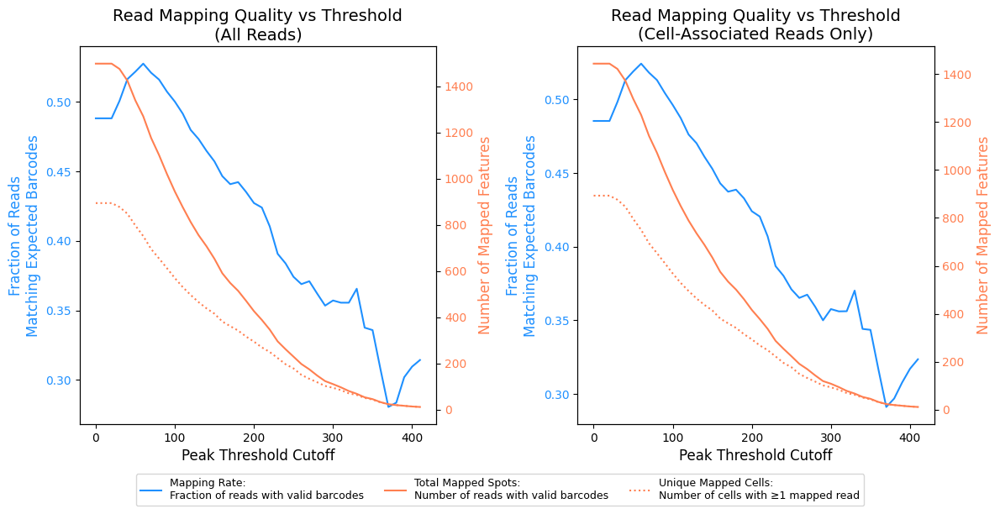

In [18]:
print("Mapping rate vs. peak threshold for determining optimal peak cutoff:")
plot_mapping_vs_threshold(df_reads, barcodes, "peak")
plt.show()

#### Left Plot (All Reads):
- Shows how the peak threshold affects all detected reads
- Blue line: Mapping rate (fraction of reads matching expected barcodes)
- Solid orange line: Total number of mapped spots (reads with valid barcodes)
- Dotted orange line: Number of unique cells with at least one mapped read

#### Right Plot (Cell-Associated Reads Only):
- Shows the same metrics but only for reads associated with cells

#### Setting Threshold Peaks:
Look for the point where the blue line (mapping rate) begins to plateau (~400)
- Consider the trade-off with number of mapped spots and cells
- A threshold around 300-500 typically provides a good balance:
  - Achieves ~75% mapping rate
  - Retains a reasonable number of mapped spots
  - Maintains coverage across cells

## <font color='red'>Diagnostics</font> 

- Evaluating optimal threshold for maximum mappinh rate
- Evaluating segmentation by mapping percentile of spots inside / outside cells
- Plotting unmapped reads
- Summary statistics 

In [ ]:
# Evaluate mapping rates across a range of peak thresholds
import numpy as np

# Define a range of thresholds to test
threshold_range = np.arange(50, 90, 5)

results = []

for threshold in threshold_range:
    # Filter reads by threshold
    filtered_reads = df_reads[df_reads['peak'] >= threshold]
    
    if len(filtered_reads) == 0:
        continue
    
    # Calculate metrics
    total_reads = len(filtered_reads)
    matched_reads = len(filtered_reads[filtered_reads['barcode'].isin(barcodes)])
    mapping_rate = (matched_reads / total_reads * 100) if total_reads > 0 else 0
    
    # Count unique cells
    total_cells = filtered_reads['cell'].nunique()
    matched_cells = filtered_reads[filtered_reads['barcode'].isin(barcodes)]['cell'].nunique()
    matched_cells_pct = (matched_cells / total_cells * 100) if total_cells > 0 else 0

    results.append({
        'threshold': threshold,
        'mapping_rate': mapping_rate,
        'total_reads': total_reads,
        'matched_reads': matched_reads,
        'total_cells': total_cells,
        'matched_cells': matched_cells,
        'matched_cells_pct': matched_cells_pct
    })

# Convert to DataFrame for easy viewing
results_df = pd.DataFrame(results)
display(results_df)

# Find the threshold with the highest mapping rate
best_threshold = results_df.loc[results_df['mapping_rate'].idxmax()]
print(f"\n=== OPTIMAL THRESHOLD ===")
print(f"Peak threshold: {best_threshold['threshold']}")
print(f"Mapping rate: {best_threshold['mapping_rate']:.2f}%")
print(f"Total reads: {int(best_threshold['total_reads'])}")
print(f"Matched reads: {int(best_threshold['matched_reads'])}")
print(f"Total cells: {int(best_threshold['total_cells'])}")
print(f"Matched cells: {int(best_threshold['matched_cells'])}")

,threshold,mapping_rate,total_reads,matched_reads,total_cells,matched_cells,matched_cells_pct
0,50,52.182385,2566,1339,1055,797,75.545024
1,55,52.627324,2474,1302,1014,776,76.528600
2,60,52.762775,2407,1270,984,751,76.321138
3,65,52.532189,2330,1224,947,728,76.874340
4,70,52.104564,2257,1176,911,695,76.289791
5,75,51.755586,2193,1135,877,671,76.510832
6,80,51.615925,2135,1102,854,654,76.580796
7,85,50.992736,2065,1053,823,630,76.549210



=== OPTIMAL THRESHOLD ===
Peak threshold: 60.0
Mapping rate: 52.76%
Total reads: 2407
Matched reads: 1270
Total cells: 984
Matched cells: 751


In [19]:
# Evaluate mapping results at default threshold
mapped = (df_bases['cell'] > 0).sum()
unmapped = (df_bases['cell'] == 0).sum()
total = len(df_bases)

print(f"Percentage mapped to cells: {mapped / total * 100:.2f}%")
print(f"Percentage not mapped to cells: {unmapped / total * 100:.2f}%")

Percentage mapped to cells: 96.97%
Percentage not mapped to cells: 3.03%


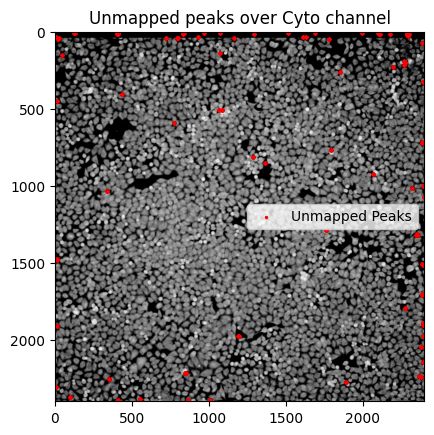

In [21]:
# plotting unmapped peaks
import matplotlib.pyplot as plt

# Get peaks DataFrame
unmapped = df_bases[df_bases['cell'] == 0]

# Show cytoplasm or DAPI image
plt.imshow(cellpose_rgb[1], cmap='gray')
plt.scatter(unmapped['j'], unmapped['i'], color='red', s=2, label='Unmapped Peaks')
plt.title("Unmapped peaks over Cyto channel")
plt.legend()
plt.show()

In [22]:
# Summary statistics
print("Total segmented cells:", len(np.unique(cells)) - 1)  # Subtract 1 for background
print("Cells with ≥1 mapped read:", df_reads['cell'].nunique())
print(f"Percentage cells with mapped reads: {df_reads['cell'].nunique() / (len(np.unique(cells)) - 1) * 100:.2f}%")
print("Cells with ≥1 read (any):", df_reads['cell'].nunique())
print("Cells with matched barcode:", df_reads[df_reads['barcode'].isin(barcodes)]['cell'].nunique())
print(f"Percentage matched: {(df_reads[df_reads['barcode'].isin(barcodes)]['cell'].nunique() / df_reads['cell'].nunique() * 100):.2f}%")

Total segmented cells: 4060
Cells with ≥1 mapped read: 1275
Percentage cells with mapped reads: 31.40%
Cells with ≥1 read (any): 1275
Cells with matched barcode: 894
Percentage matched: 70.12%


## Set up final optimal threshold ##

In [20]:
THRESHOLD_READS = 60

Extracted bases:


/lab/ops_analysis/lourido/ramon-analysis/brieflow/workflow/lib/sbs/extract_bases.py:134: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df.stack([CYCLE, CHANNEL])


,read,cycle,channel,intensity,cell,i,j,tile,well
0,0,1,G,88,0,5,405,1301,A1
1,0,1,T,97,0,5,405,1301,A1
2,0,1,A,874,0,5,405,1301,A1
3,0,1,C,1040,0,5,405,1301,A1
4,0,2,G,1013,0,5,405,1301,A1
...,...,...,...,...,...,...,...,...,...
134507,2401,13,C,90,4051,2362,2233,1301,A1
134508,2401,14,G,503,4051,2362,2233,1301,A1
134509,2401,14,T,145,4051,2362,2233,1301,A1
134510,2401,14,A,59,4051,2362,2233,1301,A1


Base intensity across cycles:


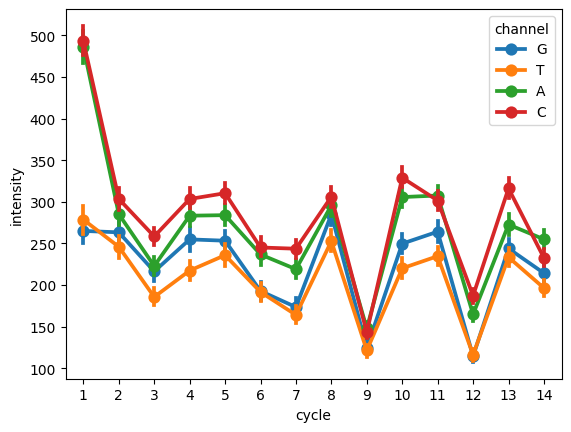

Intensity for each base:


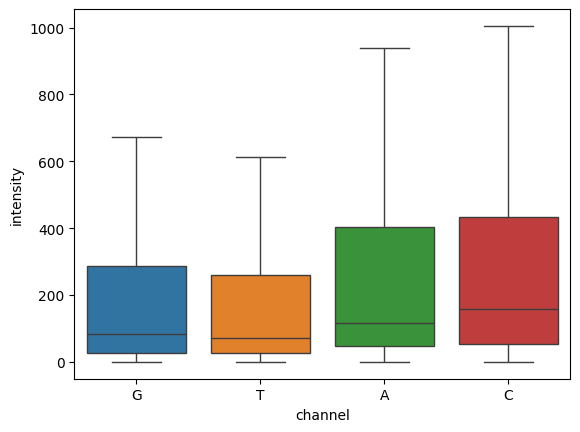

Different normalization methods


/lab/ops_analysis/lourido/ramon-analysis/brieflow/workflow/lib/sbs/call_reads.py:333: RuntimeWarning: invalid value encountered in divide
  X_rel = X / rowsums
/lab/ops_analysis/lourido/ramon-analysis/brieflow/workflow/lib/sbs/call_reads.py:333: RuntimeWarning: invalid value encountered in divide
  X_rel = X / rowsums


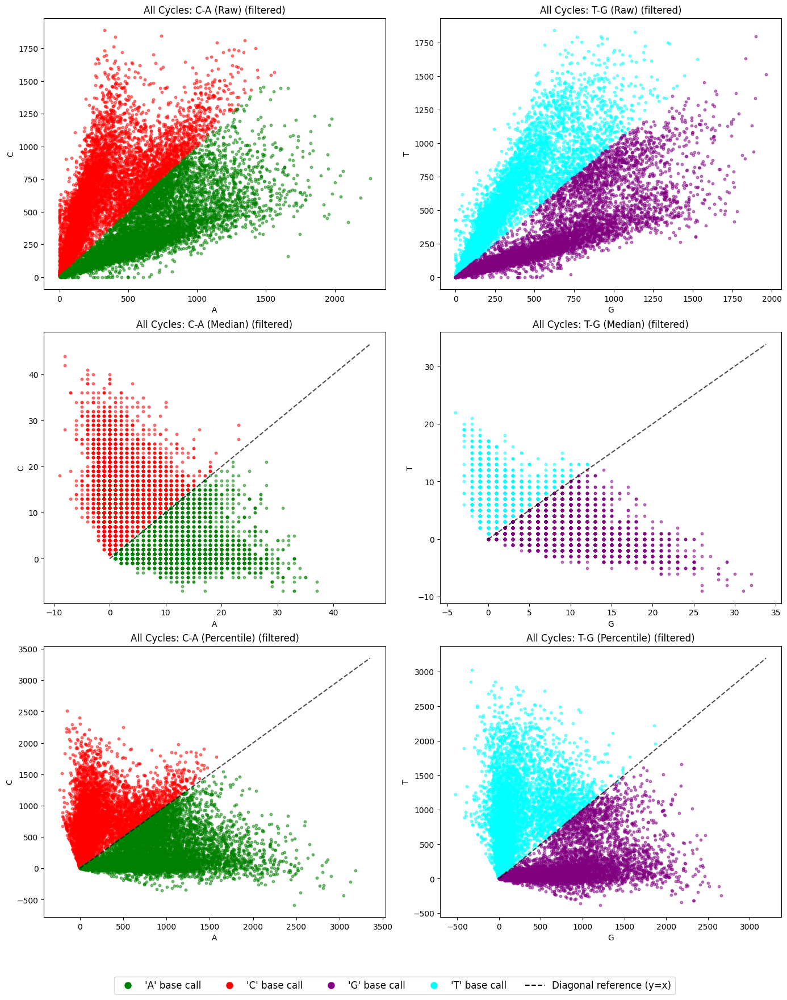

In [21]:
# Re-run extract_bases and call_reads with the new threshold
print("Extracted bases:")
df_bases = extract_bases(
    peaks, maxed, cells if SEGMENT_CELLS else nuclei, THRESHOLD_READS, wildcards=WILDCARDS, bases=BASES
)
display(df_bases)

print("Base intensity across cycles:")
ax = sns.pointplot(x="cycle", y="intensity", hue="channel", data=df_bases)
plt.show()

print("Intensity for each base:")
ax = sns.boxplot(
    x="channel", y="intensity", hue="channel", data=df_bases, showfliers=False
)
plt.show()

print("Different normalization methods")
plot_normalization_comparison(df_bases, base_order = BASES)

In [22]:
print("Called reads:")
df_reads = call_reads(df_bases, peaks_data=peaks)
display(df_reads)

Called reads:


,read,cell,i,j,tile,well,barcode,Q_0,Q_1,Q_2,...,Q_6,Q_7,Q_8,Q_9,Q_10,Q_11,Q_12,Q_13,Q_min,peak
2,0,0,5,405,1301,A1,AGTTAAGGGGCCAA,0.091515,0.000000,0.050954,...,0.839036,0.046555,1.00000,1.000000,0.276692,1.000000,0.505557,0.704629,0.000000,332.204744
58,1,0,5,410,1301,A1,CGTTCAGGGGACAA,0.657625,0.479625,0.096323,...,1.000000,1.000000,1.00000,1.000000,0.000000,0.943358,0.376985,0.657625,0.000000,245.746961
114,2,0,5,968,1301,A1,CATTACTAGCGGAG,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.73814,1.000000,1.000000,1.000000,1.000000,1.000000,0.738140,119.877846
170,3,0,5,1073,1301,A1,CCAAAGACTAGTGC,1.000000,1.000000,0.657625,...,1.000000,0.415037,1.00000,1.000000,0.870850,0.773706,0.773706,0.634788,0.415037,185.100936
226,4,0,6,123,1301,A1,TTGGCCCATGCTCA,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,0.870850,149.943109
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134122,2395,4035,2360,1813,1301,A1,CAACCCAGAAAACC,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.00000,1.000000,1.000000,0.000000,0.738140,0.738140,0.000000,60.751510
133730,2388,4040,2355,892,1301,A1,GTGAACTGACACGA,1.000000,0.415037,0.415037,...,1.000000,1.000000,1.00000,1.000000,1.000000,0.738140,1.000000,1.000000,0.415037,103.390546
133954,2392,4040,2357,881,1301,A1,TTGAACTGACACGA,0.046555,0.339036,1.000000,...,1.000000,0.596323,1.00000,0.666667,0.369070,1.000000,0.424103,1.000000,0.046555,226.364214
134402,2400,4051,2362,2226,1301,A1,CCTACATCACGCGG,1.000000,1.000000,0.943358,...,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,0.943358,215.040214


## <font color='red'>SET PARAMETERS</font>

### Read Prioritization Method: Peak vs. Count

The `SORT_CALLS` parameter determines how barcodes are prioritized when assigning reads to cells. This choice depends on your sequencing protocol:

**Count Prioritization (`SORT_CALLS = "count"`):**
- Prioritizes barcodes based on the **number of spots** detected per cell
- **Recommended for mRNA barcode protocols** (e.g., IVT-based perturbations)
- Why: mRNA barcodes produce multiple spots per cell, so more spots = more confident call
- Best for protocols where barcode signal is distributed throughout the cell

**Peak Prioritization (`SORT_CALLS = "peak"`):**
- Prioritizes barcodes based on the **peak intensity** of spots
- **Recommended for DNA barcode protocols** (e.g., Zombie, T7 amplification)
- Why: DNA barcodes typically produce a singular, bright spot per cell
- Best for protocols with focused, high-intensity signal

**Default**: `"count"` is the default and works well for most applications.

### Read Mapping Parameters

**Common to both barcode modes:**
- `Q_MIN`: Minimum quality score for base reads (default: 0)
- `ERROR_CORRECT`: Enable read error correction (default: False)
- `SORT_CALLS`: Method for prioritizing barcodes - 'count' for mRNA protocols, 'peak' for DNA protocols
- `MAX_DISTANCE`: Maximum edit distance for barcode matching (optional)

**Simple mode specific:**
- `BARCODE_COL`: Column in barcode library with full sequences (default: "sgRNA")
- `PREFIX_COL`: Column with pre-computed prefixes, or None for auto-truncation

**Multi mode specific:**
- `MAP_START`, `MAP_END`: Cycle positions defining MAP region for first barcode
- `RECOMB_START`, `RECOMB_END`: Cycle positions defining RECOMB region
- `MAP_COL`, `RECOMB_COL`: Columns in barcode library for MAP/RECOMB sequences
- `RECOMB_FILTER_COL`, `RECOMB_Q_THRESH`: Optional recombination filtering parameters

The Q_min plot below helps determine optimal sequence quality cutoff:

Mapping rate vs. Q_min for determining optimal sequence quality cutoff:


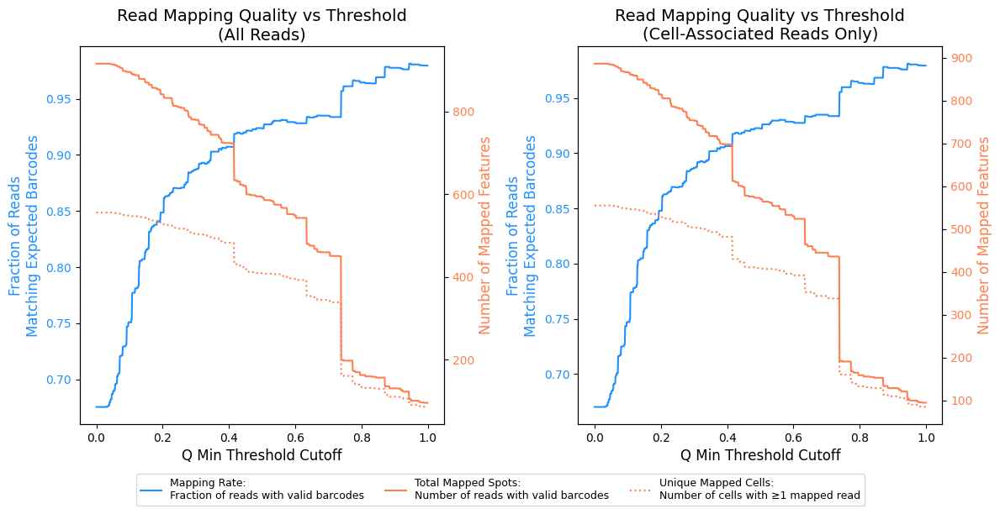

In [23]:
print("Mapping rate vs. Q_min for determining optimal sequence quality cutoff:")
plot_mapping_vs_threshold(df_reads, barcodes, "Q_min")
plt.show()

#### Left Plot (All Reads):
- Shows how Q_min threshold affects all detected reads
- Blue line: Mapping rate (fraction of reads matching expected barcodes)
- Solid red line: Total number of mapped spots (reads with valid barcodes)
- Dotted red line: Number of unique cells with at least one mapped read

#### Right Plot (Cell-Associated Reads Only):
- Shows the same metrics but only for reads associated with cells

#### Interpreting Q_min Results:
With our optimized peak threshold, these plots confirm that adjusting Q_min provides little benefit:
- The mapping rate (blue line) is already very high at Q_min = 0
- Increasing Q_min only marginally improves mapping rate 
- However, this comes at a significant cost:
  - Total mapped spots and mapped cells decreases substantially
- The small gain in mapping rate doesn't justify the large loss of data

In [24]:
# Common parameters for both modes
Q_MIN = 0
ERROR_CORRECT = True
SORT_CALLS = "count"
MAX_DISTANCE = 1  # Optional: maximum edit distance for barcode matching

if BARCODE_TYPE == "simple":
    # Simple mode: standard single-barcode protocol
    BARCODE_COL = "sgRNA"
    PREFIX_COL = "prefix"
    
    # Multi-mode parameters set to None
    MAP_START = None
    MAP_END = None
    MAP_COL = None
    RECOMB_START = None
    RECOMB_END = None
    RECOMB_COL = None
    RECOMB_FILTER_COL = None
    RECOMB_Q_THRESH = None
    BARCODE_INFO_COLS = None

elif BARCODE_TYPE == "multi":
    # Multi mode: multi-barcode protocol with recombination detection
    # Define cycle positions for MAP and RECOMB regions
    MAP_START = None     # Start cycle for MAP region (e.g., 0)
    MAP_END = None       # End cycle for MAP region (e.g., 5)
    RECOMB_START = None  # Start cycle for RECOMB region (e.g., 6)
    RECOMB_END = None    # End cycle for RECOMB region (e.g., 11)
    
    # Define columns in barcode library
    MAP_COL = "map_prefix"          # Column with MAP region sequences
    RECOMB_COL = "recomb_prefix"    # Column with RECOMB region sequences
    
    # Optional: recombination filtering
    RECOMB_FILTER_COL = None  # Column to filter by (e.g., "no_recomb_0")
    RECOMB_Q_THRESH = None    # Quality threshold for recombination calls
    
    # Optional: additional barcode info columns to include in output
    BARCODE_INFO_COLS = None  # e.g., ["barcode_full", "gene_family"]
    
    # Simple mode parameters set to None
    BARCODE_COL = None
    PREFIX_COL = None

else:
    raise ValueError(f"BARCODE_TYPE must be 'simple' or 'multi', got '{BARCODE_TYPE}'")

Calling cells with barcode mapping...
Using pre-computed prefixes from 'prefix' column
performing error correction
Called 983 cells using simple mode


,cell,tile,well,Q_0,Q_1,Q_2,Q_3,Q_4,Q_5,Q_6,...,cell_barcode_count_0,cell_barcode_1,cell_barcode_count_1,barcode_count,barcode_peak_0,barcode_peak_1,gene_symbol_0,gene_id_0,gene_symbol_1,gene_id_1
0,4,1301,A1,1.0,1.000000,0.738140,1.000000,1.00000,1.000000,1.000000,...,1,NaN,0.0,1,NaN,NaN,TGGT1_210370,TGGT1_210370_3,NaN,NaN
1,6,1301,A1,1.0,1.000000,1.000000,1.000000,1.00000,1.000000,0.000000,...,1,TGGATTGCTACCCC,1.0,2,NaN,NaN,TGGT1_243298,TGGT1_243298_3,TGGT1_280670,TGGT1_280670_1
2,19,1301,A1,1.0,1.000000,1.000000,1.000000,1.00000,0.415037,0.000000,...,1,NaN,0.0,1,NaN,NaN,TGGT1_206640,TGGT1_206640_3,NaN,NaN
3,20,1301,A1,1.0,1.000000,0.634788,1.000000,1.00000,0.738140,0.000000,...,1,NaN,0.0,1,NaN,NaN,NaN,NaN,NaN,NaN
4,30,1301,A1,1.0,1.000000,0.415037,0.415037,1.00000,0.738140,1.000000,...,1,NaN,0.0,1,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
978,4027,1301,A1,1.0,0.738140,1.000000,1.000000,1.00000,1.000000,1.000000,...,1,NaN,0.0,1,NaN,NaN,NaN,NaN,NaN,NaN
979,4033,1301,A1,1.0,0.452589,1.000000,1.000000,1.00000,1.000000,0.415037,...,2,NaN,0.0,2,NaN,NaN,TGGT1_248440,TGGT1_248440_2,NaN,NaN
980,4035,1301,A1,1.0,1.000000,1.000000,0.738140,0.73814,0.738140,1.000000,...,1,NaN,0.0,1,NaN,NaN,NaN,NaN,NaN,NaN
981,4040,1301,A1,1.0,0.415037,0.415037,1.000000,1.00000,1.000000,1.000000,...,1,TTGAACTGACACGA,1.0,2,NaN,NaN,NaN,NaN,NaN,NaN


Minimal phenotype features:


,area,i,j,cell,bounds,tile,well
0,327.0,12.993884,153.880734,1,"(3, 144, 25, 164)",1301,A1
1,465.0,14.341935,1341.529032,2,"(3, 1329, 27, 1355)",1301,A1
2,333.0,12.627628,1745.105105,3,"(3, 1735, 23, 1757)",1301,A1
3,373.0,14.863271,1899.209115,4,"(4, 1889, 27, 1911)",1301,A1
4,346.0,14.832370,891.606936,5,"(6, 880, 25, 904)",1301,A1
...,...,...,...,...,...,...,...
4055,470.0,2373.712766,1187.738298,4056,"(2363, 1175, 2385, 1202)",1301,A1
4056,385.0,2369.114286,443.374026,4057,"(2360, 432, 2380, 456)",1301,A1
4057,241.0,2375.145228,674.775934,4058,"(2367, 665, 2384, 684)",1301,A1
4058,330.0,2383.542424,2323.687879,4059,"(2375, 2313, 2394, 2335)",1301,A1


Summary of the fraction of cells mapping to one barcode:


,well,tile,fraction of cells mapping to 1 gene symbols
1,A1,1301,0.156158


Summary of the fraction of cells mapping to any barcode:


,well,tile,fraction of cells mapping to >=1 gene symbols
1,A1,1301,0.183251


Histogram of the number of reads per cell:


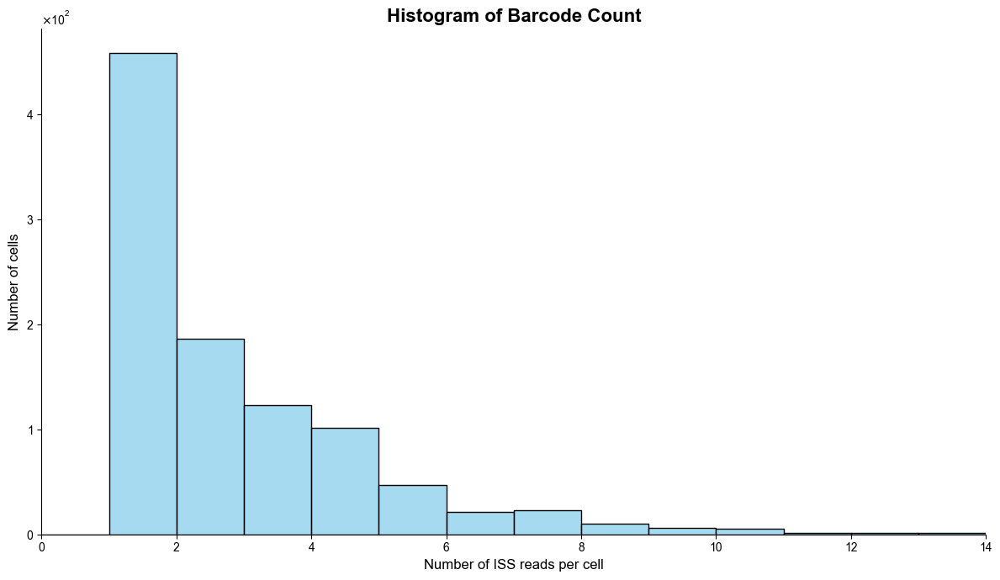

Histogram of the number of counts of each unique gene symbols:


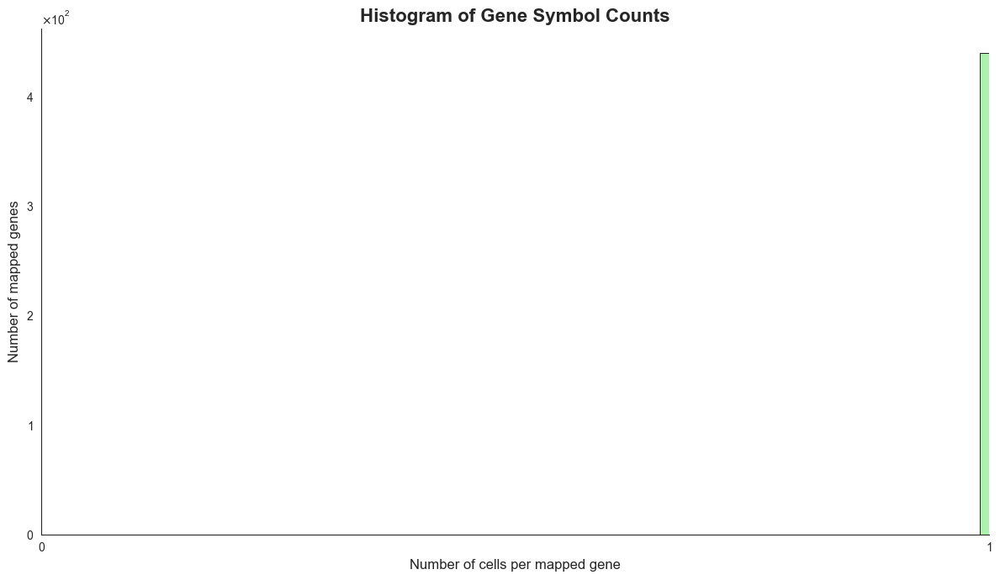

In [25]:
print("Calling cells with barcode mapping...")

if BARCODE_TYPE == "simple":
    # Simple mode: single-barcode protocol (call cells directly)
    df_cells = call_cells(
        df_reads, 
        df_barcode_library=df_barcode_library, 
        q_min=Q_MIN, 
        barcode_col=BARCODE_COL, 
        prefix_col=PREFIX_COL, 
        error_correct=ERROR_CORRECT,
        sort_calls=SORT_CALLS,
        max_distance=MAX_DISTANCE,
    )
    
elif BARCODE_TYPE == "multi":
    # Multi mode: prep reads first, then call cells
    from lib.sbs.call_cells import prep_multi_reads
    
    print("Preparing multi-barcode reads...")
    df_reads_prepped = prep_multi_reads(
        df_reads,
        map_start=MAP_START,
        map_end=MAP_END,
        recomb_start=RECOMB_START,
        recomb_end=RECOMB_END,
        map_col=MAP_COL,
        recomb_col=RECOMB_COL,
    )
    
    print("Calling cells with multi-barcode detection...")
    df_cells = call_cells(
        reads_data=df_reads_prepped,
        df_barcode_library=df_barcode_library,
        q_min=Q_MIN,
        map_start=MAP_START,
        map_end=MAP_END,
        map_col=MAP_COL,
        recomb_start=RECOMB_START,
        recomb_end=RECOMB_END,
        recomb_col=RECOMB_COL,
        recomb_filter_col=RECOMB_FILTER_COL,
        recomb_q_thresh=RECOMB_Q_THRESH,
        error_correct=ERROR_CORRECT,
        sort_calls=SORT_CALLS,
        max_distance=MAX_DISTANCE,
        barcode_info_cols=BARCODE_INFO_COLS,
    )

print(f"Called {len(df_cells)} cells using {BARCODE_TYPE} mode")
display(df_cells)

print("Minimal phenotype features:")
df_sbs_info = extract_phenotype_minimal(
    phenotype_data=nuclei, nuclei_data=nuclei, wildcards=WILDCARDS
)
display(df_sbs_info)

print("Summary of the fraction of cells mapping to one barcode:")
one_barcode_mapping = plot_cell_mapping_heatmap(
    df_cells,
    df_sbs_info,
    barcodes,
    mapping_to="one",
    mapping_strategy="gene symbols",
    shape="6W_sbs",
    return_plot=False,
    return_summary=True,
)
display(one_barcode_mapping)

print("Summary of the fraction of cells mapping to any barcode:")
any_barcode_mapping = plot_cell_mapping_heatmap(
    df_cells,
    df_sbs_info,
    barcodes,
    mapping_to="any",
    mapping_strategy="gene symbols",
    shape="6W_sbs",
    return_plot=False,
    return_summary=True,
)
display(any_barcode_mapping)

print("Histogram of the number of reads per cell:")
outliers = plot_cell_metric_histogram(df_cells, sort_by=SORT_CALLS)
plt.show()

print("Histogram of the number of counts of each unique gene symbols:")
outliers = plot_gene_symbol_histogram(df_cells)
plt.show()

In [26]:
# ============ BARCODE MAPPING DIAGNOSTICS ============
print("\n" + "="*60)
print("BARCODE MAPPING DIAGNOSTICS")
print("="*60)

# Total cells
total_cells = len(df_cells)
print(f"\nTotal cells segmented: {total_cells}")

# Cells with valid barcode matches (gene_symbol_0 is populated)
cells_with_barcode = df_cells['gene_symbol_0'].notna().sum()
cells_without_barcode = df_cells['gene_symbol_0'].isna().sum()

print(f"\nCells with matched barcode: {cells_with_barcode} ({cells_with_barcode/total_cells*100:.1f}%)")
print(f"Cells without barcode: {cells_without_barcode} ({cells_without_barcode/total_cells*100:.1f}%)")

# Cells with single barcode match (gene_symbol_1 is null - only one match)
cells_single_match = (df_cells['gene_symbol_0'].notna() & df_cells['gene_symbol_1'].isna()).sum()
print(f"Cells with single gene match: {cells_single_match} ({cells_single_match/total_cells*100:.1f}%)")

# Cells with multiple barcode matches
cells_multiple_match = (df_cells['gene_symbol_0'].notna() & df_cells['gene_symbol_1'].notna()).sum()
print(f"Cells with multiple gene matches: {cells_multiple_match} ({cells_multiple_match/total_cells*100:.1f}%)")

# Show top genes
if cells_with_barcode > 0:
    print("\nTop 10 most frequent genes (primary match):")
    print(df_cells['gene_symbol_0'].value_counts().head(10))
    
    # Unique genes detected
    unique_genes = df_cells['gene_symbol_0'].nunique()
    print(f"\nTotal unique genes detected: {unique_genes}")

# Quality score distribution
print(f"\nMean Q_min score: {df_cells['Q_min'].mean():.2f}")
print(f"Median Q_min score: {df_cells['Q_min'].median():.2f}")

# Barcode count distribution
print(f"\nMean barcode count per cell: {df_cells['barcode_count'].mean():.1f}")
print(f"Median barcode count per cell: {df_cells['barcode_count'].median():.1f}")

# Mapped statistics
mapped_primary = df_cells['mapped_0'].sum()
print(f"\nCells with mapped primary barcode: {mapped_primary} ({mapped_primary/total_cells*100:.1f}%)")

print("="*60 + "\n")


BARCODE MAPPING DIAGNOSTICS

Total cells segmented: 983

Cells with matched barcode: 744 (75.7%)
Cells without barcode: 239 (24.3%)
Cells with single gene match: 634 (64.5%)
Cells with multiple gene matches: 110 (11.2%)

Top 10 most frequent genes (primary match):
gene_symbol_0
TGGT1_241000    5
TGGT1_245432    5
TGGT1_293190    4
TGGT1_321460    4
TGGT1_216335    4
TGGT1_291150    4
TGGT1_211600    4
TGGT1_307045    4
TGGT1_211695    4
TGGT1_218770    4
Name: count, dtype: int64

Total unique genes detected: 566

Mean Q_min score: 0.29
Median Q_min score: 0.05

Mean barcode count per cell: 2.4
Median barcode count per cell: 2.0

Cells with mapped primary barcode: 744 (75.7%)



## Automated Parameter Optimization (Optional)

This section provides an automated way to optimize SBS parameters by testing multiple parameter combinations and evaluating their performance. This is particularly useful when you're unsure about the optimal values for `PEAK_WIDTH` and `THRESHOLD_READS`.

**How it works:**
1. Define a grid of parameters to test (e.g., different peak widths and threshold values)
2. For each combination, the full SBS pipeline is run automatically
3. Results are evaluated using a metric function
4. Multi-panel visualizations show the primary optimization metric alongside secondary metrics to help you understand trade-offs
5. After identifying optimal parameters, subset the results and re-evaluate with detailed plots

**Available metrics:**
- `metric_specificity`: (Recommended) Ratio of cells with exactly one barcode to cells with any barcode. Higher is better (1.0 = perfect, all mapped cells have exactly one barcode).
- `metric_one_barcode_fraction`: Fraction of all cells that map to exactly one barcode. Useful when maximizing total mapped cells is a priority.
- `metric_any_barcode_fraction`: Fraction of all cells that map to any barcode (one or more). Useful for understanding overall mapping coverage.

**Note:** This can take several minutes depending on the number of combinations tested. Start with a small grid for initial exploration.

In [ ]:
# # Uncomment to run automated parameter search

# from lib.sbs.automated_parameter_search import (
#     automated_parameter_search,
#     visualize_parameter_results,
#     get_best_parameters,
#     metric_one_barcode_fraction,
#     metric_any_barcode_fraction,
#     metric_specificity,
# )

# # Define parameter grid to test
# # This is the primary input you'll customize for your analysis
# param_grid = {
#     'peak_width': [5, 10, 15, 20],           # Test different peak detection widths
#     'threshold_reads': [50, 100, 150, 200],  # Test different intensity thresholds
# }

In [ ]:
# # Select optimization metric
# # metric_specificity is recommended as it balances quality (one barcode per cell) with coverage
# OPTIMIZATION_METRIC = metric_specificity

# # Define parameters that stay constant across all tests
# fixed_params = {
#     'max_filter_width': MAX_FILTER_WIDTH,
#     'call_reads_method': CALL_READS_METHOD,
#     'q_min': Q_MIN,
#     'error_correct': ERROR_CORRECT,
#     'sort_calls': SORT_CALLS,
# }

# # Add mode-specific parameters to fixed_params
# if BARCODE_TYPE == "simple":
#     fixed_params.update({
#         'barcode_col': BARCODE_COL,
#         'prefix_col': PREFIX_COL,
#     })
#     if MAX_DISTANCE is not None:
#         fixed_params['max_distance'] = MAX_DISTANCE
        
# elif BARCODE_TYPE == "multi":
#     fixed_params.update({
#         'map_start': MAP_START,
#         'map_end': MAP_END,
#         'map_col': MAP_COL,
#         'recomb_start': RECOMB_START,
#         'recomb_end': RECOMB_END,
#         'recomb_col': RECOMB_COL,
#         'recomb_filter_col': RECOMB_FILTER_COL,
#         'recomb_q_thresh': RECOMB_Q_THRESH,
#     })
#     if MAX_DISTANCE is not None:
#         fixed_params['max_distance'] = MAX_DISTANCE
#     if BARCODE_INFO_COLS is not None:
#         fixed_params['barcode_info_cols'] = BARCODE_INFO_COLS

In [ ]:
# # Run automated parameter search and evaluation
# print(f"Testing {len(param_grid['peak_width']) * len(param_grid['threshold_reads'])} parameter combinations...")
# results_df, df_cells_all = automated_parameter_search(
#     aligned_images=aligned,
#     mask=cells if SEGMENT_CELLS else nuclei,  # Use 'cells' if spots are in cell bodies, 'nuclei' if spots are nuclear
#     barcodes=barcodes,
#     df_barcode_library=df_barcode_library,
#     wildcards=WILDCARDS,
#     bases=BASES,
#     extra_channel_indices=EXTRA_CHANNEL_INDICES,
#     param_grid=param_grid,
#     fixed_params=fixed_params,
#     metric_fn=OPTIMIZATION_METRIC,
#     barcode_type=BARCODE_TYPE,  # Pass the barcode type
#     verbose=True
# )

# # Visualize results with multiple metrics
# # This will show the primary metric (specificity) plus secondary metrics
# # (one-barcode mapping, any-barcode mapping) to understand trade-offs
# visualize_parameter_results(
#     results_df, 
#     df_cells=df_cells_all,  # Pass df_cells_all to compute secondary metrics
#     metric_name='metric_score',
#     show_secondary_metrics=True  # Show multiple metric panels
# )

# # Get best parameters based on the optimization metric
# best_params = get_best_parameters(results_df, metric_name='metric_score', maximize=True)

# # Subset df_cells_all to the best parameter combination for detailed evaluation
# print("\n" + "="*60)
# print("Evaluating best parameter combination in detail")
# print("="*60)
# df_cells_best = df_cells_all[
#     (df_cells_all['peak_width'] == best_params['peak_width']) &
#     (df_cells_all['threshold_reads'] == best_params['threshold_reads'])
# ].copy()

# # Remove parameter tracking columns for cleaner display
# df_cells_best = df_cells_best.drop(columns=['peak_width', 'threshold_reads'], errors='ignore')

# print(f"\nBest parameters produce {len(df_cells_best)} called cells")
# display(df_cells_best)

# # Re-run all evaluation plots with the best parameter set
# print("\nSummary of the fraction of cells mapping to one barcode:")
# one_barcode_mapping_best = plot_cell_mapping_heatmap(
#     df_cells_best,
#     df_sbs_info,
#     barcodes,
#     mapping_to="one",
#     mapping_strategy="gene symbols",
#     shape="6W_sbs",
#     return_plot=False,
#     return_summary=True,
# )
# display(one_barcode_mapping_best)

# print("\nSummary of the fraction of cells mapping to any barcode:")
# any_barcode_mapping_best = plot_cell_mapping_heatmap(
#     df_cells_best,
#     df_sbs_info,
#     barcodes,
#     mapping_to="any",
#     mapping_strategy="gene symbols",
#     shape="6W_sbs",
#     return_plot=False,
#     return_summary=True,
# )
# display(any_barcode_mapping_best)

# print("\nHistogram of the number of reads per cell:")
# outliers_best = plot_cell_metric_histogram(df_cells_best, sort_by=SORT_CALLS)
# plt.show()

# print("\nHistogram of the number of counts of each unique gene symbols:")
# outliers_best = plot_gene_symbol_histogram(df_cells_best)
# plt.show()

# # Optionally: Update your parameters with the best values for use in the config
# # PEAK_WIDTH = int(best_params['peak_width'])
# # THRESHOLD_READS = int(best_params['threshold_reads'])

## Add sbs process parameters to config file

In [27]:
# Add sbs section
config["sbs"] = {
    "alignment_method": ALIGNMENT_METHOD,
    "channel_names": CHANNEL_NAMES,
    "upsample_factor": UPSAMPLE_FACTOR,
    "skip_cycles_indices": SKIP_CYCLES_INDICES,
    "manual_background_cycle_index": MANUAL_BACKGROUND_CYCLE_INDEX,
    "manual_channel_mapping": MANUAL_CHANNEL_MAPPING,
    "extra_channel_indices": EXTRA_CHANNEL_INDICES,
    "max_filter_width": MAX_FILTER_WIDTH,
    "spot_detection_method": SPOT_DETECTION_METHOD,
    "dapi_cycle": DAPI_CYCLE,
    "cyto_cycle": CYTO_CYCLE,
    "cyto_cycle_index": CYTO_CYCLE_INDEX,
    "dapi_index": DAPI_INDEX,
    "cyto_index": CYTO_INDEX,
    "segmentation_method": SEGMENTATION_METHOD,
    "gpu": GPU,
    "reconcile": RECONCILE,
    "segment_cells": SEGMENT_CELLS,
    "df_barcode_library_fp": DF_BARCODE_LIBRARY_FP,
    "threshold_peaks": THRESHOLD_READS,
    "call_reads_method": CALL_READS_METHOD,
    "bases": BASES,
    "q_min": Q_MIN,
    "error_correct": ERROR_CORRECT,
    "sort_calls": SORT_CALLS,
    "barcode_type": BARCODE_TYPE,
}

# Add max_distance if specified
if MAX_DISTANCE is not None:
    config["sbs"]["max_distance"] = MAX_DISTANCE

# Add barcode type specific parameters
if BARCODE_TYPE == "simple":
    config["sbs"].update({
        "barcode_col": BARCODE_COL,
        "prefix_col": PREFIX_COL,
    })
elif BARCODE_TYPE == "multi":
    config["sbs"].update({
        "map_start": MAP_START,
        "map_end": MAP_END,
        "map_col": MAP_COL,
        "recomb_start": RECOMB_START,
        "recomb_end": RECOMB_END,
        "recomb_col": RECOMB_COL,
    })
    # Add optional multi-mode parameters if defined
    if RECOMB_FILTER_COL is not None:
        config["sbs"]["recomb_filter_col"] = RECOMB_FILTER_COL
    if RECOMB_Q_THRESH is not None:
        config["sbs"]["recomb_q_thresh"] = RECOMB_Q_THRESH
    if BARCODE_INFO_COLS is not None:
        config["sbs"]["barcode_info_cols"] = BARCODE_INFO_COLS

# Add spot detection method specific parameters
if SPOT_DETECTION_METHOD == "standard":
    config["sbs"].update({
        "peak_width": PEAK_WIDTH,
    })
elif SPOT_DETECTION_METHOD == "spotiflow":
    config["sbs"].update({
        "spotiflow_cycle_index": SPOTIFLOW_CYCLE_INDEX,
        "spotiflow_model": SPOTIFLOW_MODEL,
        "spotiflow_threshold": SPOTIFLOW_THRESHOLD,
        "spotiflow_min_distance": SPOTIFLOW_MIN_DISTANCE,
    })

# Add method-specific parameters based on segmentation method
if SEGMENTATION_METHOD == "cellpose":
    config["sbs"].update({
        "nuclei_diameter": NUCLEI_DIAMETER,
        "cell_diameter": CELL_DIAMETER,
        "nuclei_flow_threshold": NUCLEI_FLOW_THRESHOLD,
        "nuclei_cellprob_threshold": NUCLEI_CELLPROB_THRESHOLD,
        "cell_flow_threshold": CELL_FLOW_THRESHOLD,
        "cell_cellprob_threshold": CELL_CELLPROB_THRESHOLD,
        "cyto_model": CELLPOSE_MODEL,
    })
    # Add helper_index only if it's defined
    if HELPER_INDEX is not None:
        config["sbs"]["helper_index"] = HELPER_INDEX
elif SEGMENTATION_METHOD == "microsam":
    config["sbs"].update({
        "microsam_model": MICROSAM_MODEL,
    })
elif SEGMENTATION_METHOD == "stardist":
    config["sbs"].update({
        "stardist_model": STARDIST_MODEL,
        "nuclei_prob_threshold": NUCLEI_PROB_THRESHOLD,
        "nuclei_nms_threshold": NUCLEI_NMS_THRESHOLD,
        "cell_prob_threshold": CELL_PROB_THRESHOLD,
        "cell_nms_threshold": CELL_NMS_THRESHOLD,
    })
elif SEGMENTATION_METHOD == "watershed":
    config["sbs"].update({
        "threshold_dapi": THRESHOLD_DAPI,
        "nucleus_area_min": NUCLEUS_AREA[0],
        "nucleus_area_max": NUCLEUS_AREA[1],
        "threshold_cell": THRESHOLD_CELL,
    })

# Write the updated configuration back with markdown-style comments
with open(CONFIG_FILE_PATH, "w") as config_file:
    # Write the introductory markdown-style comments
    config_file.write(CONFIG_FILE_HEADER)

    # Dump the updated YAML structure, keeping markdown comments for sections
    yaml.dump(config, config_file, default_flow_style=False, sort_keys=False)